In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/My\Drive\/ExamenB2/

11b11M_10s_2024-06-07T16_34_31_979.png	11g6M_2024-06-10T22_14_41_252.wav
11b11M_10s_2024-06-07T16_34_31_979.wav	11g9M_2024-06-10T22_15_14_523.png
11b1M_10s_2024-06-07T16_29_41_676.png	11g9M_2024-06-10T22_15_14_523.wav
11b1M_10s_2024-06-07T16_29_41_676.wav	11nMcs2_2024-06-10T22_04_49_017.png
11b2M_10s_2024-06-07T16_31_19_367.png	11nMcs2_2024-06-10T22_04_49_017.wav
11b2M_10s_2024-06-07T16_31_19_367.wav	11nMcs3_1_2024-06-10T22_08_49_126.png
11g12M_2024-06-10T22_15_47_218.png	11nMcs3_1_2024-06-10T22_08_49_126.wav
11g12M_2024-06-10T22_15_47_218.wav	11nMcs4_2024-06-10T22_09_59_695.png
11g18M_2024-06-10T22_16_22_663.png	11nMcs4_2024-06-10T22_09_59_695.wav
11g18M_2024-06-10T22_16_22_663.wav	11nMcs5_2024-06-10T22_10_37_840.png
11g24M_2024-06-10T22_17_21_574.png	11nMcs5_2024-06-10T22_10_37_840.wav
11g24M_2024-06-10T22_17_21_574.wav	11nMcs6_2024-06-10T22_11_15_732.png
11g36M_2024-06-10T22_17_57_895.png	11nMcs6_2024-06-10T22_11_15_732.wav
11g36M_2024-06-10T22_17_57_895.wav	11nMcs7_2024-06-10T22_11

<ipython-input-3-0d57b3f57e1e>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


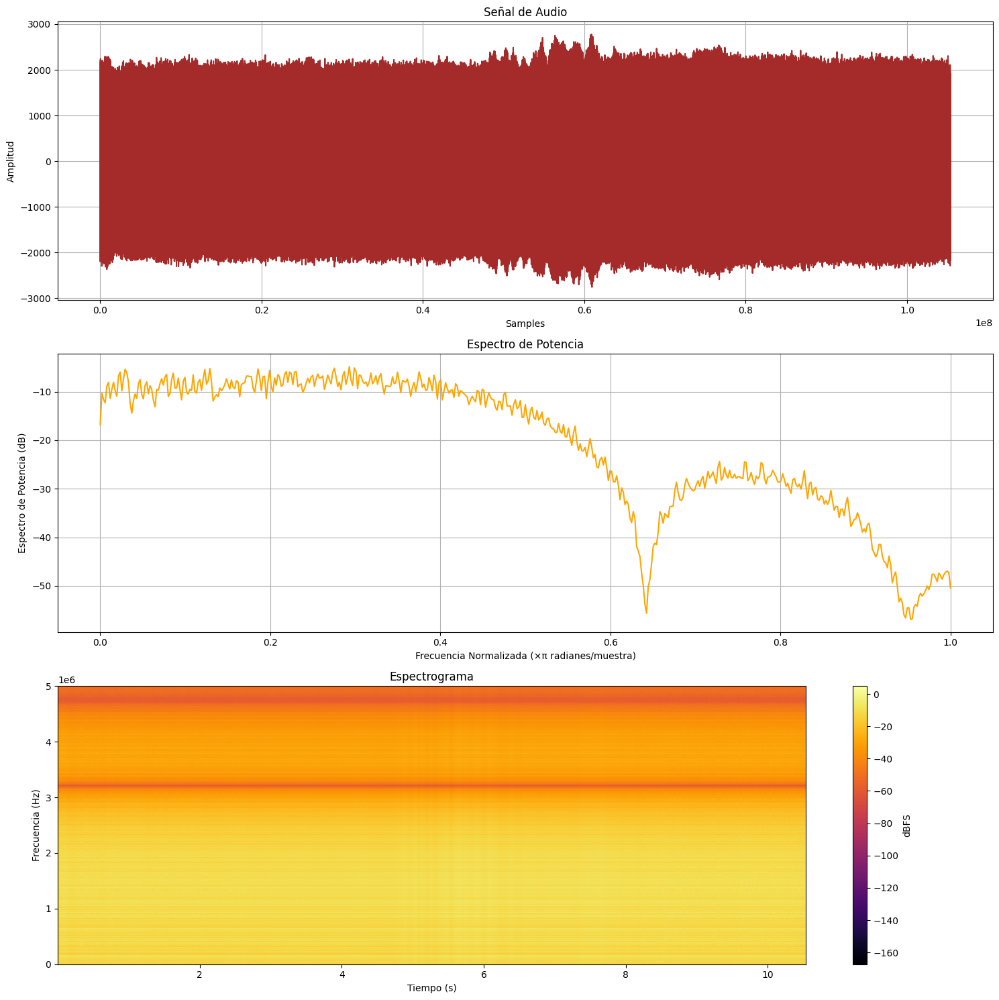

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11b1M_10s_2024-06-07T16_29_41_676.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias a la mitad del rango de muestreo
normalized_frequencies = frequencies / (sample_rate / 2)

# Gráfica del espectro de potencia
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, power_spectrum_db, color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11b

<ipython-input-4-7fd2490ef121>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


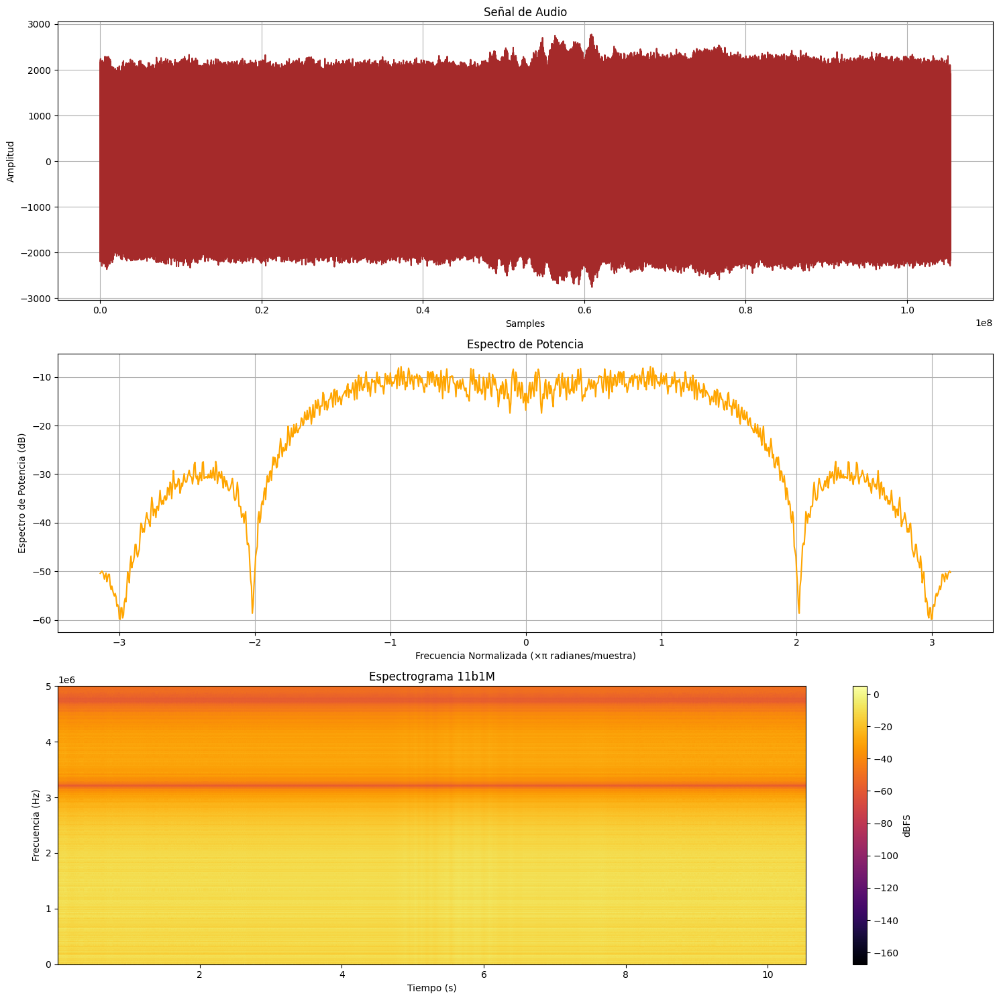

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11b1M_10s_2024-06-07T16_29_41_676.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b1M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-6-4c85d06aca88>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


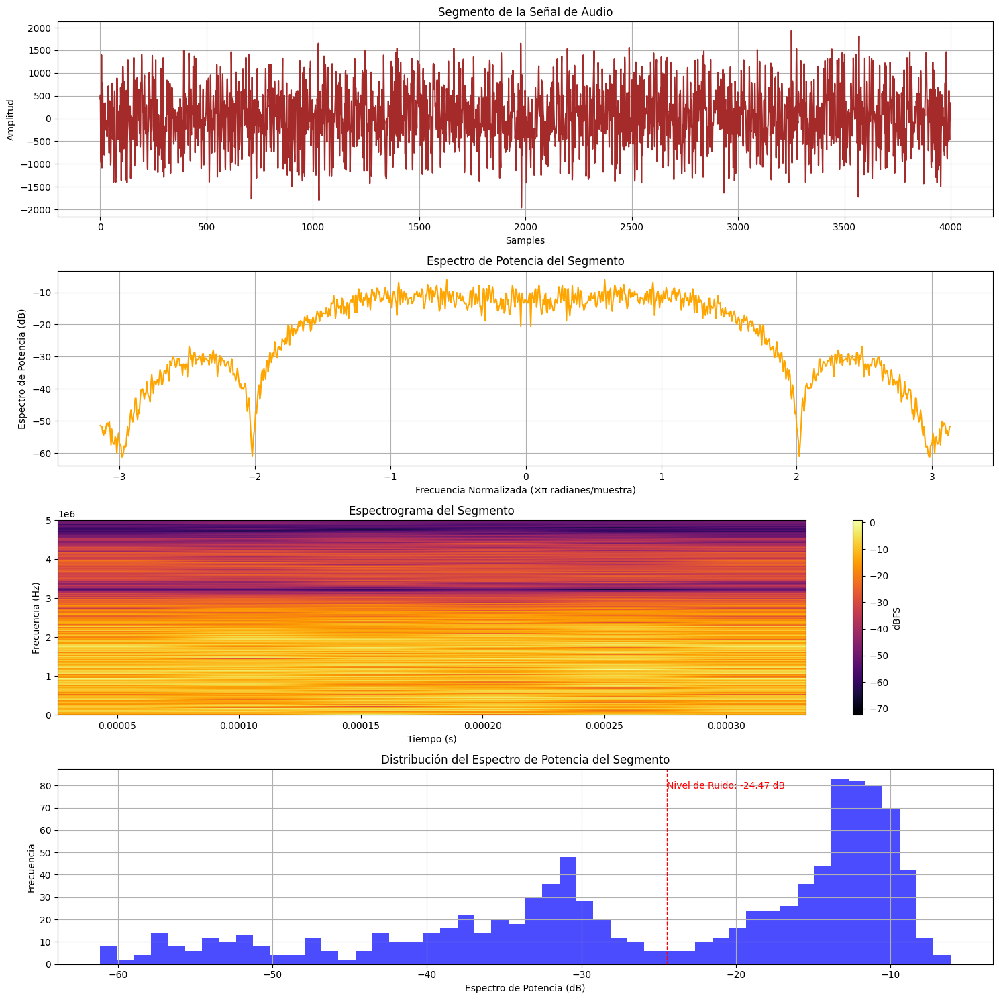

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11b1M_10s_2024-06-07T16_29_41_676.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-5-5faa9c3b6e97>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


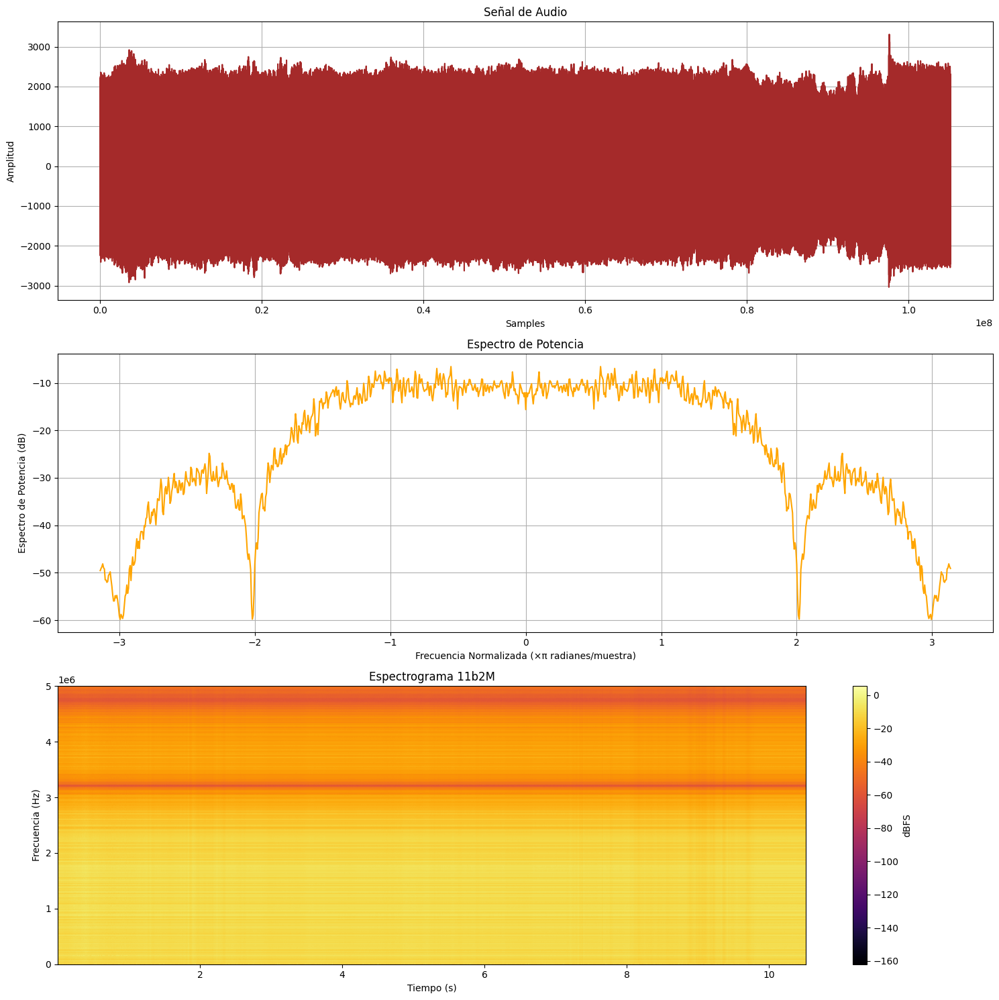

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11b2M_10s_2024-06-07T16_31_19_367.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b2M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-7-7e78ab970faf>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


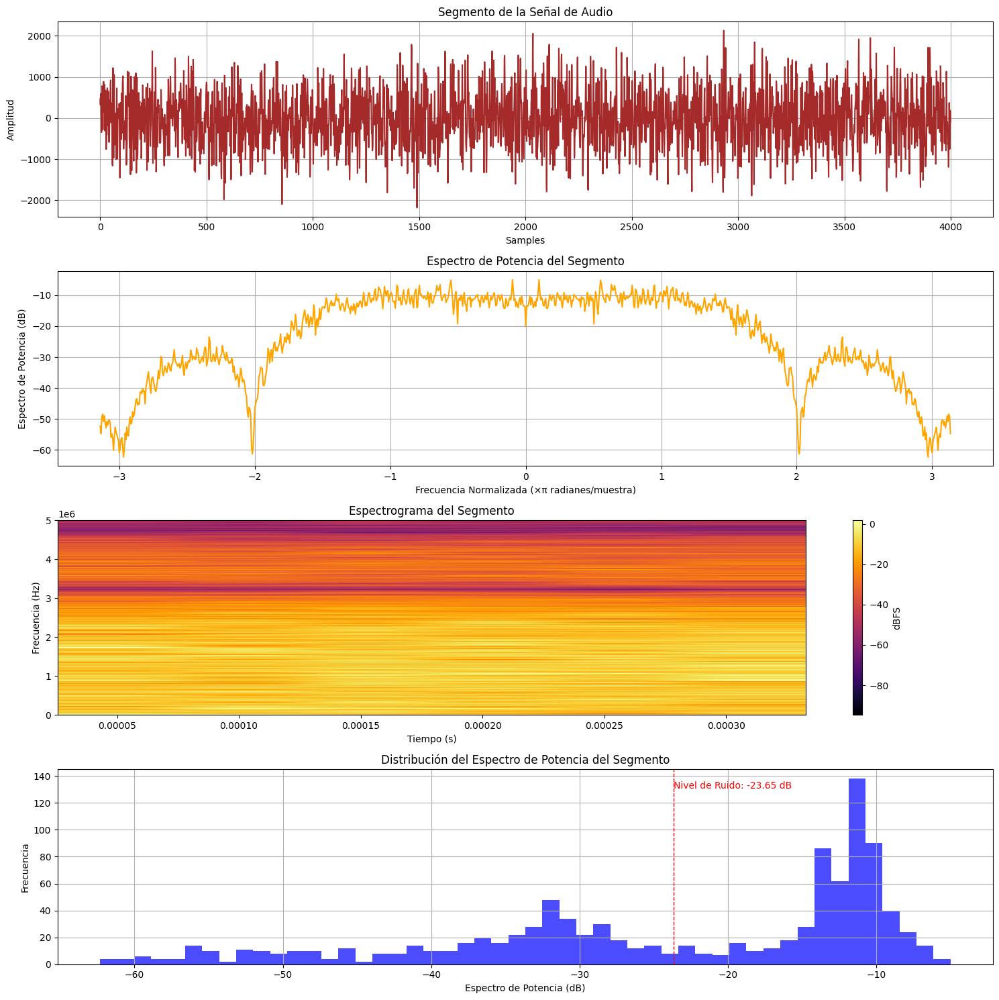

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11b2M_10s_2024-06-07T16_31_19_367.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-6-6894f4c4df04>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


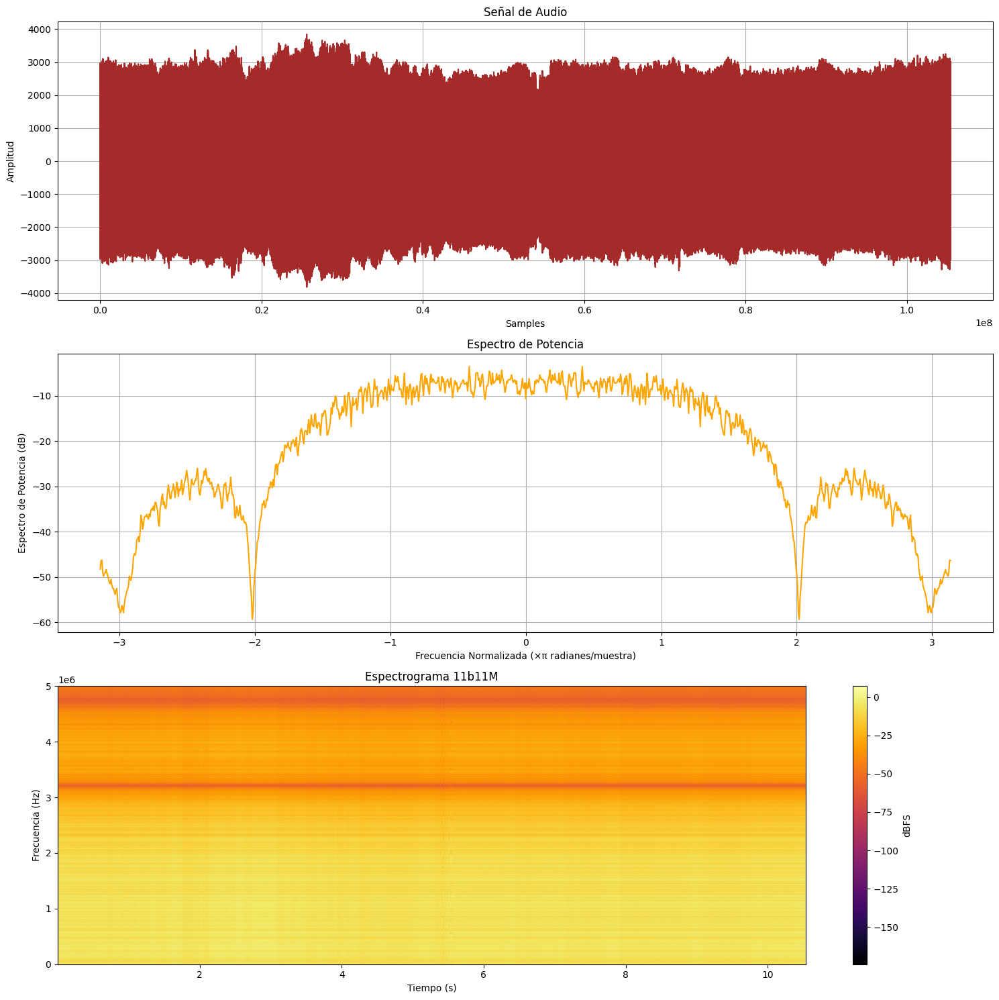

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11b11M_10s_2024-06-07T16_34_31_979.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11b11M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-7-7ba6070f237e>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


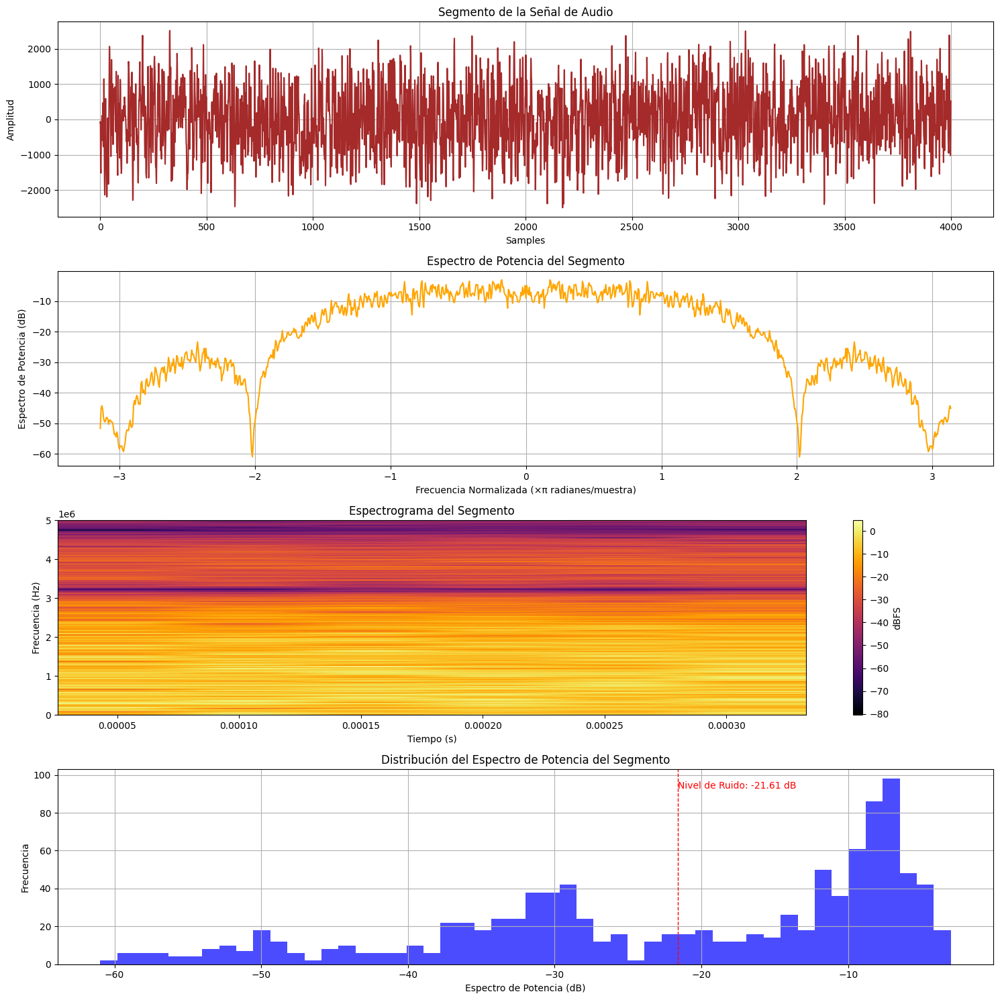

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11b11M_10s_2024-06-07T16_34_31_979.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señal de ruido

<ipython-input-7-0089a27ea704>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


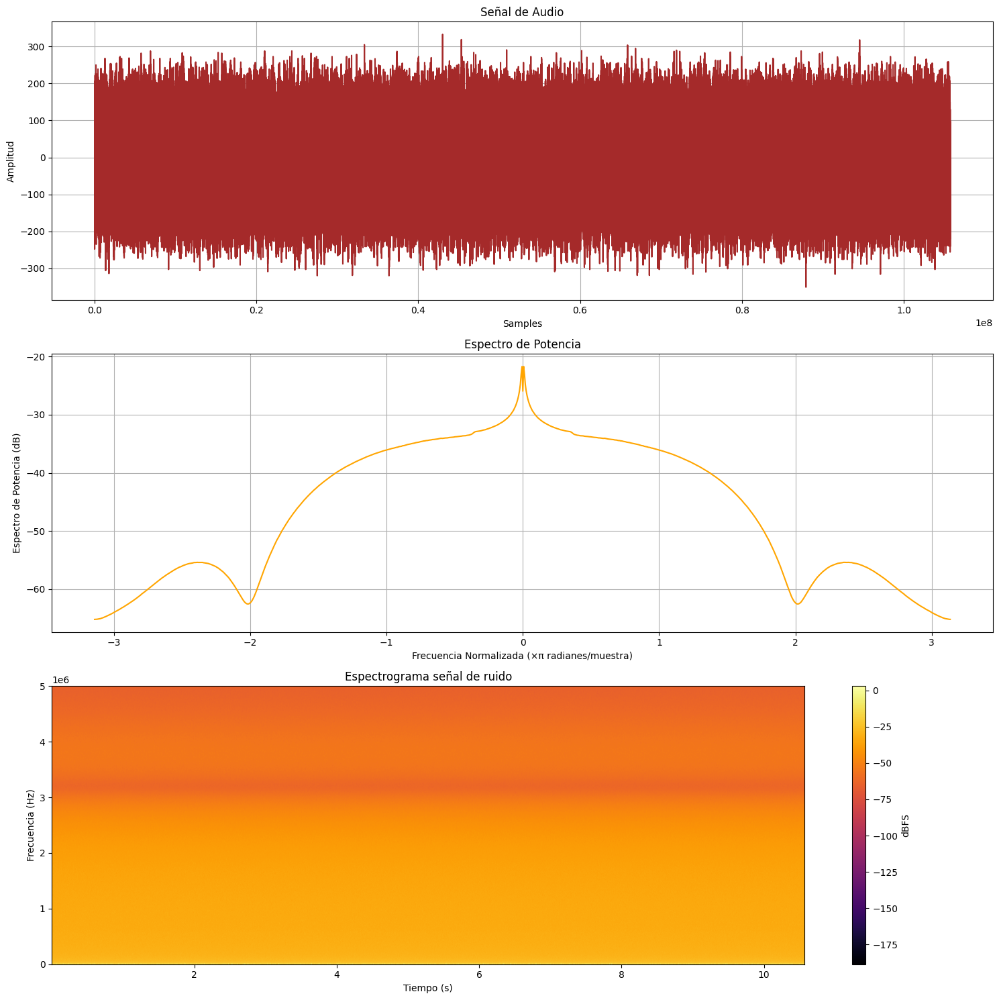

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11Ruido_2024-06-07T17_15_23_948.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma señal de ruido')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-8-122bfae40d99>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


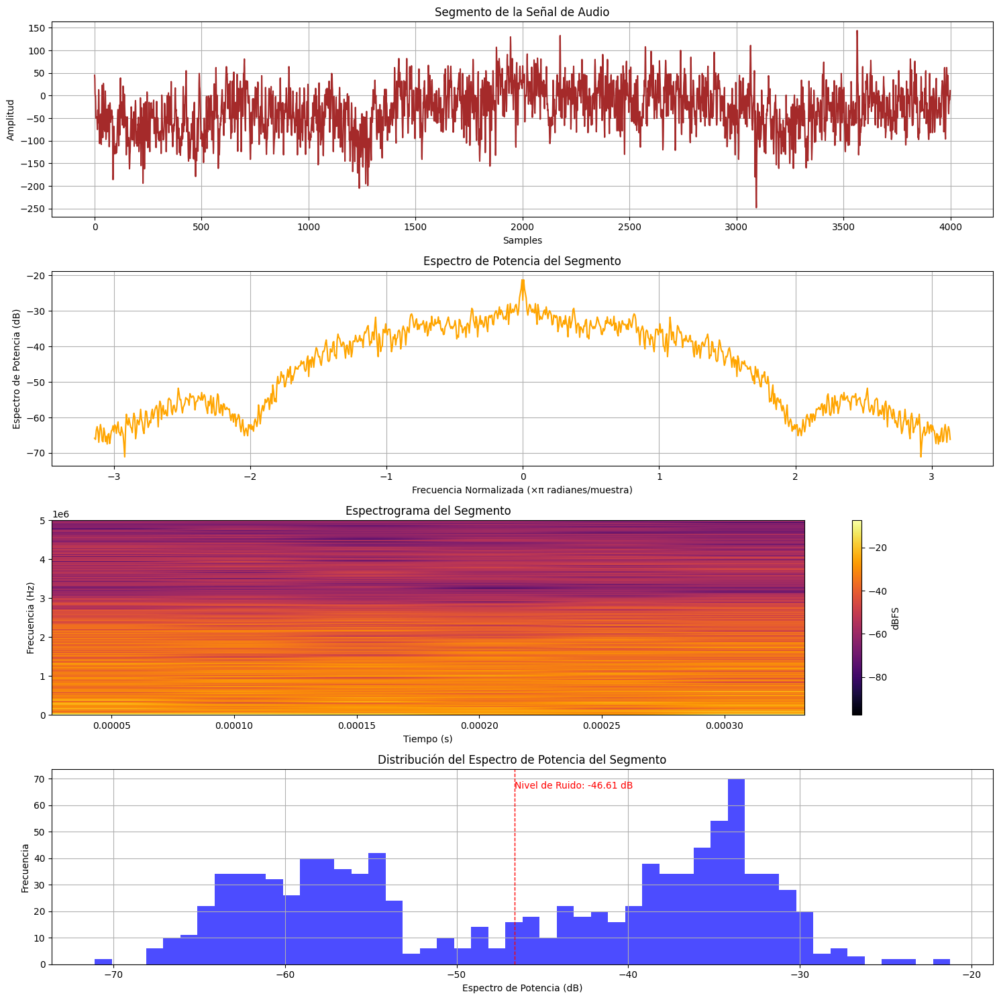

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11Ruido_2024-06-07T17_15_23_948.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11n

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-9-f3653f508486>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


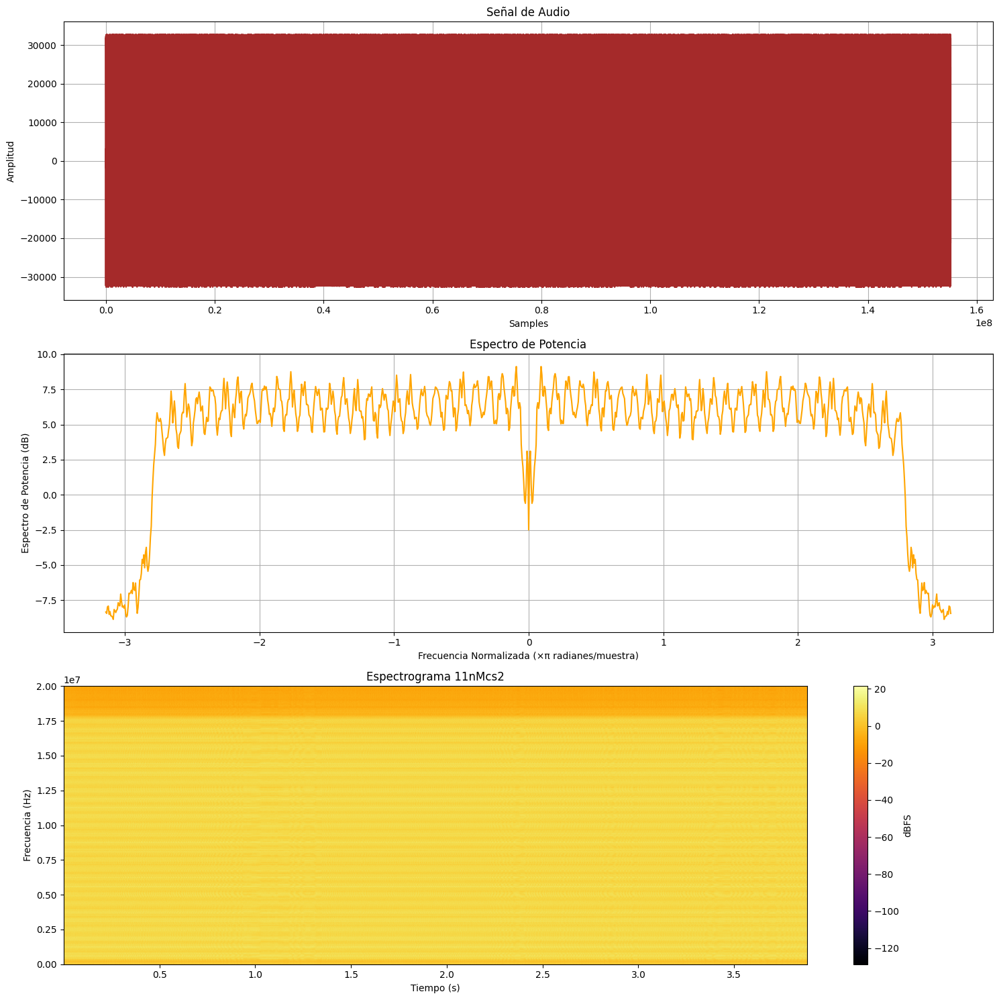

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs2_2024-06-10T22_04_49_017.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs2')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-3-b74d5fbb4342>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


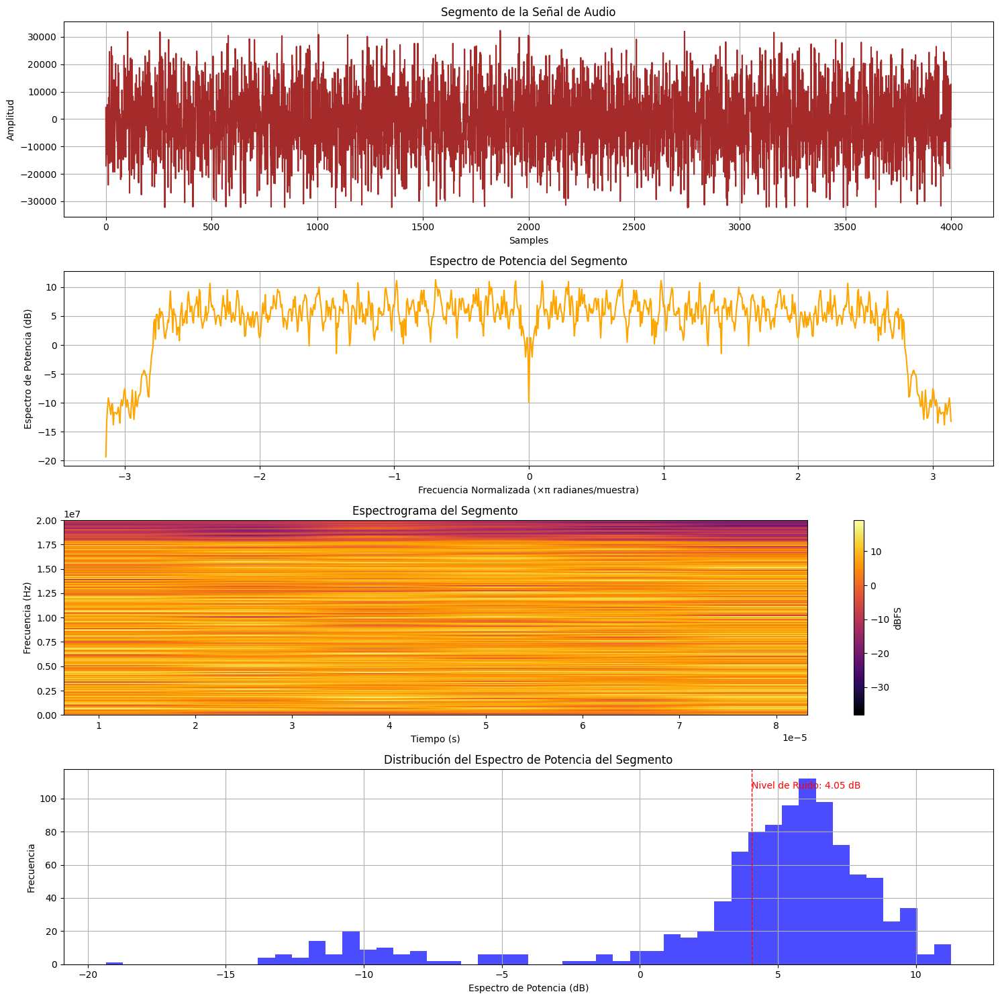

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs2_2024-06-10T22_04_49_017.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-10-19ec6f389fdd>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


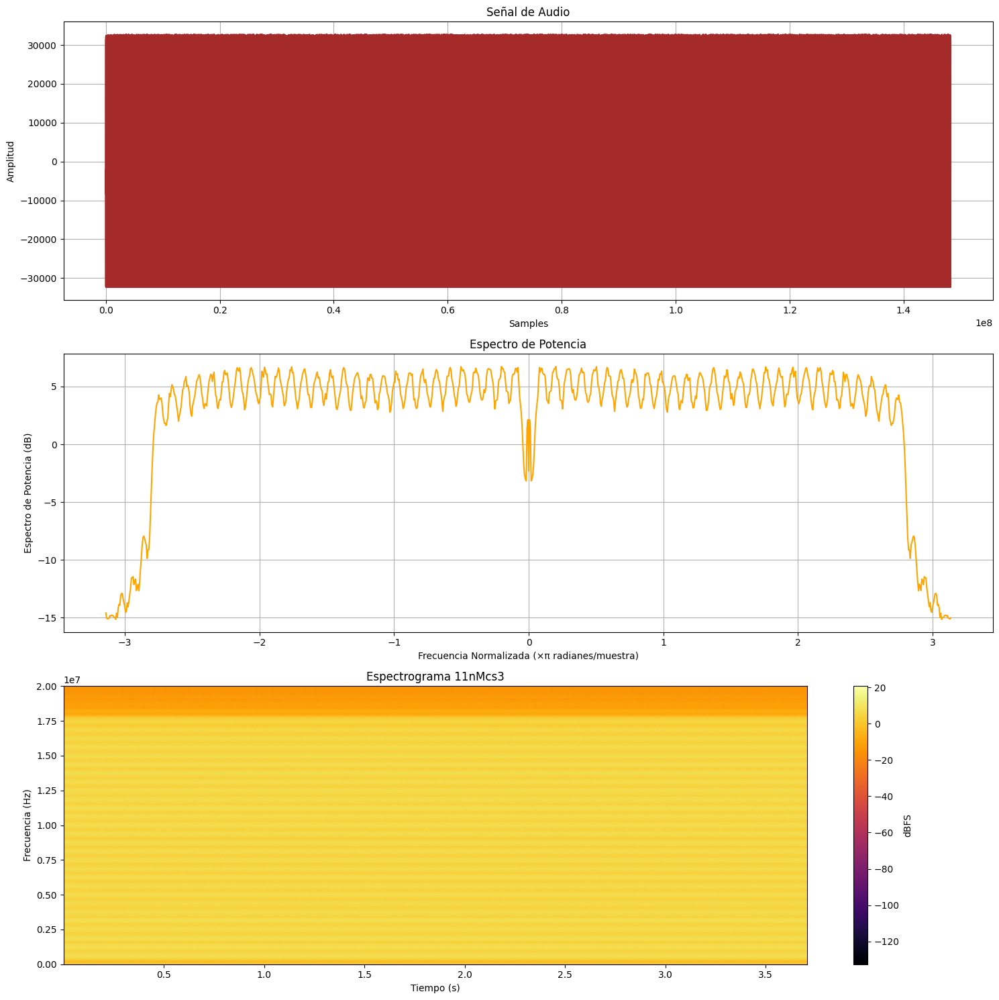

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs3_1_2024-06-10T22_08_49_126.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs3')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-11-f21c75c3867a>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


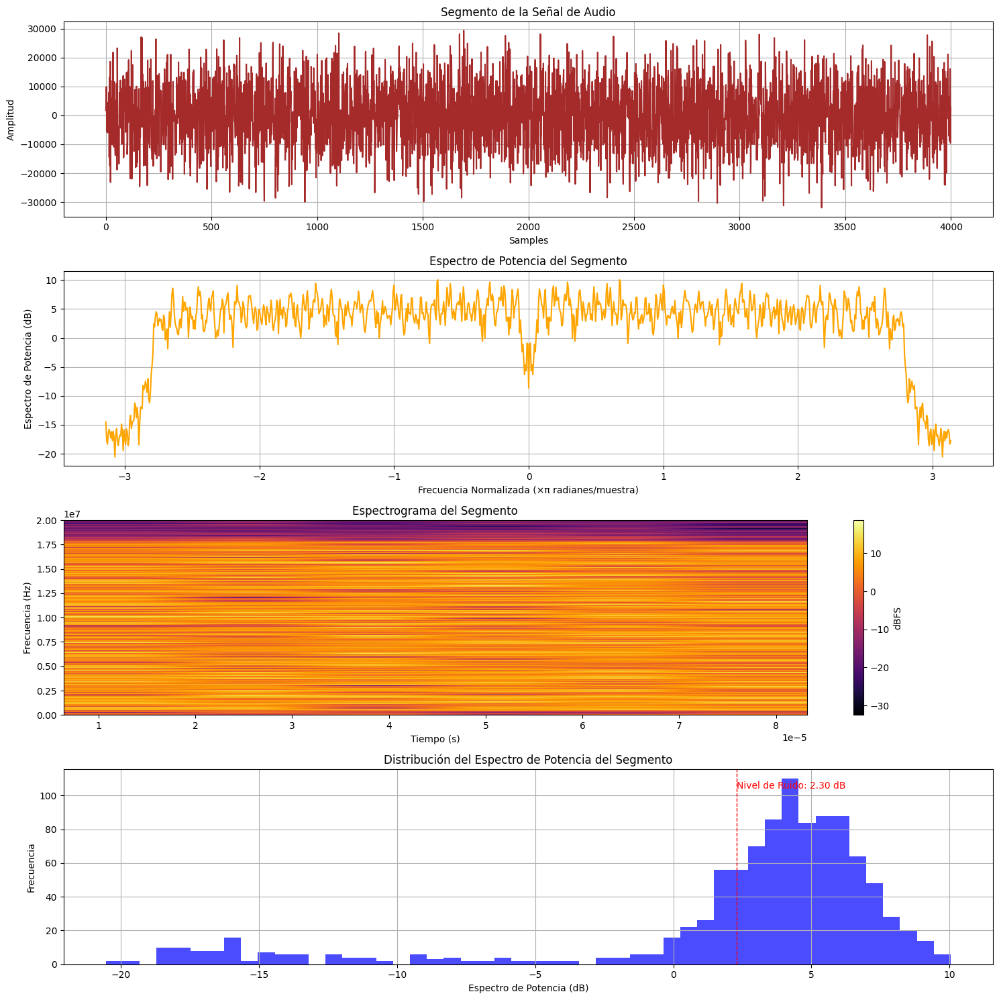

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs3_1_2024-06-10T22_08_49_126.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-11-c08f5ed76561>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


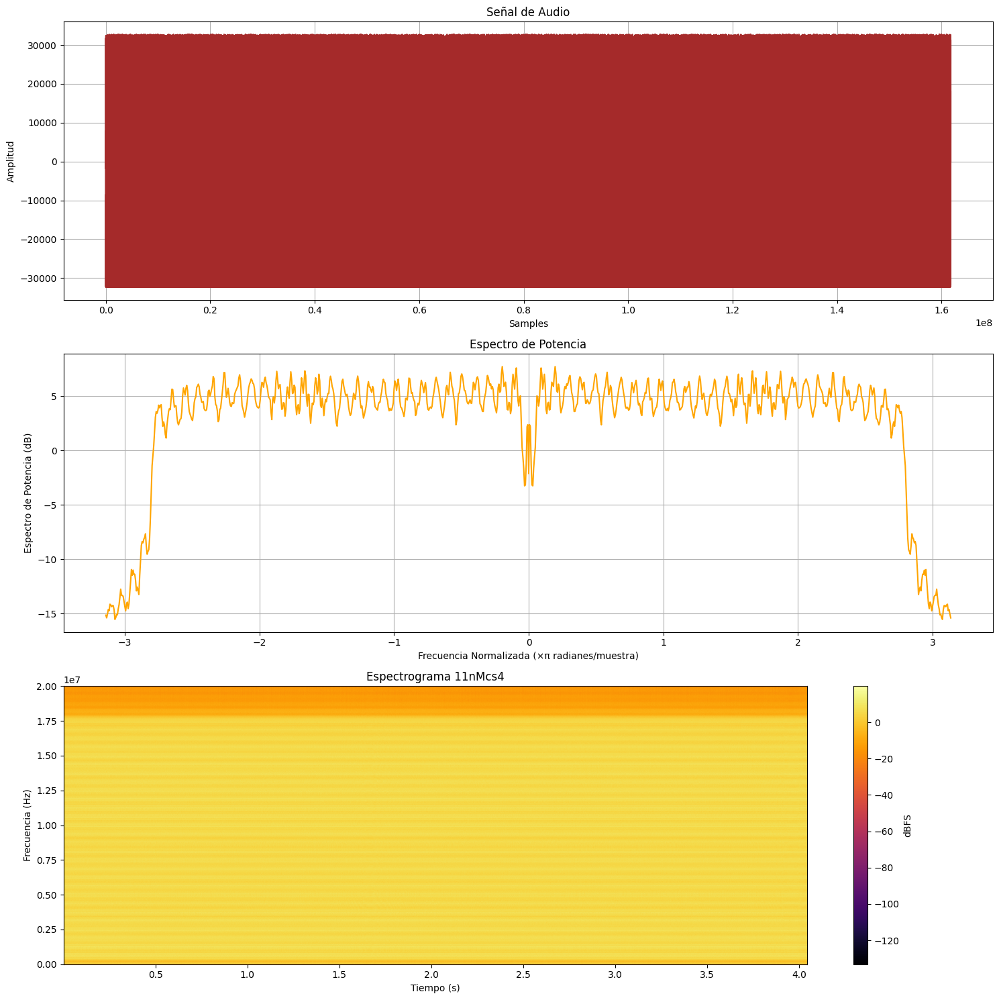

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs4_2024-06-10T22_09_59_695.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs4')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-12-da83c5d49b42>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


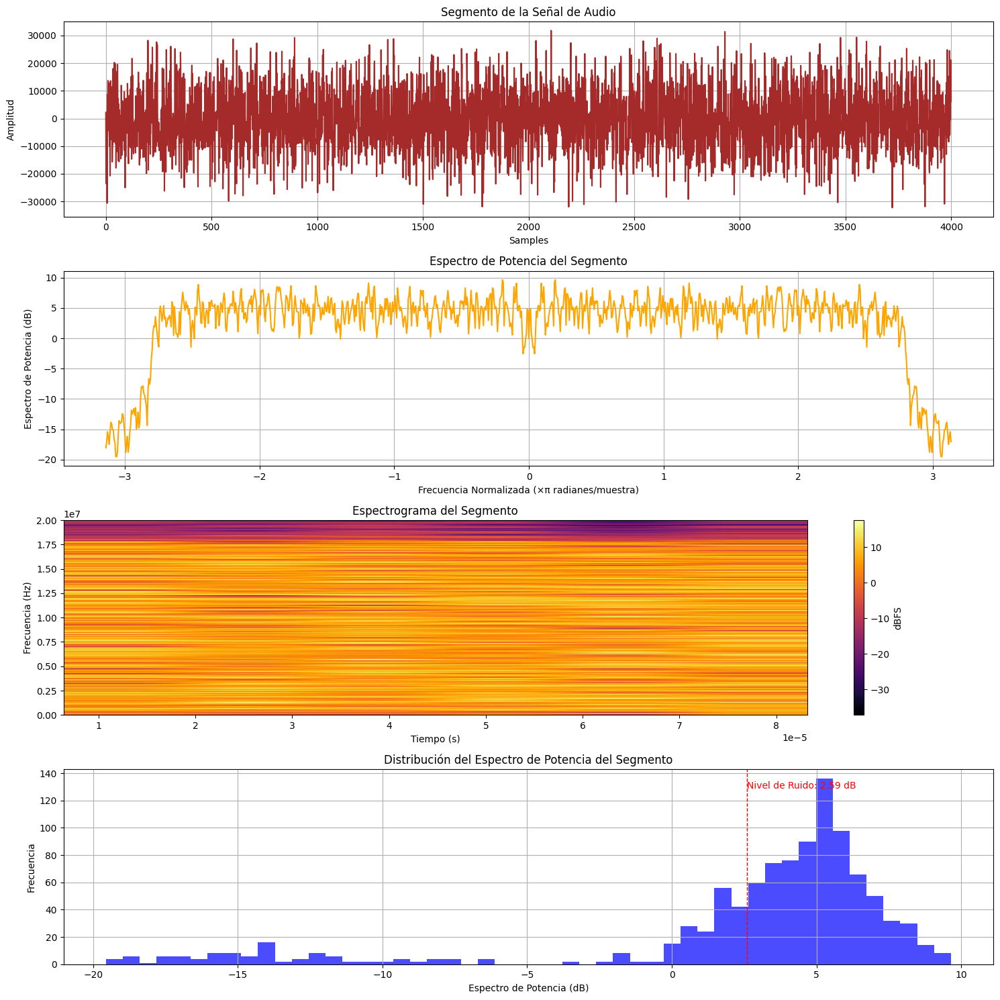

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs4_2024-06-10T22_09_59_695.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-12-c1152f446bb4>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


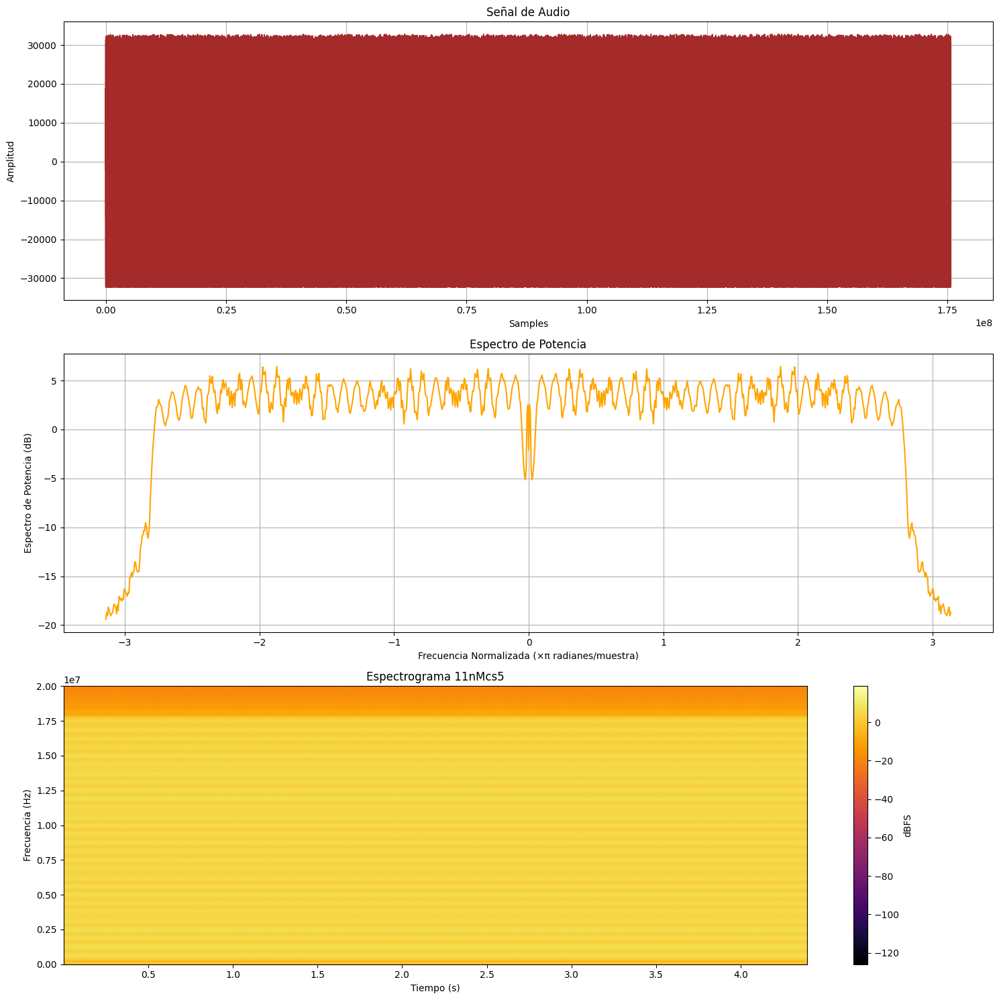

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs5_2024-06-10T22_10_37_840.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs5')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-13-228dd0280b62>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


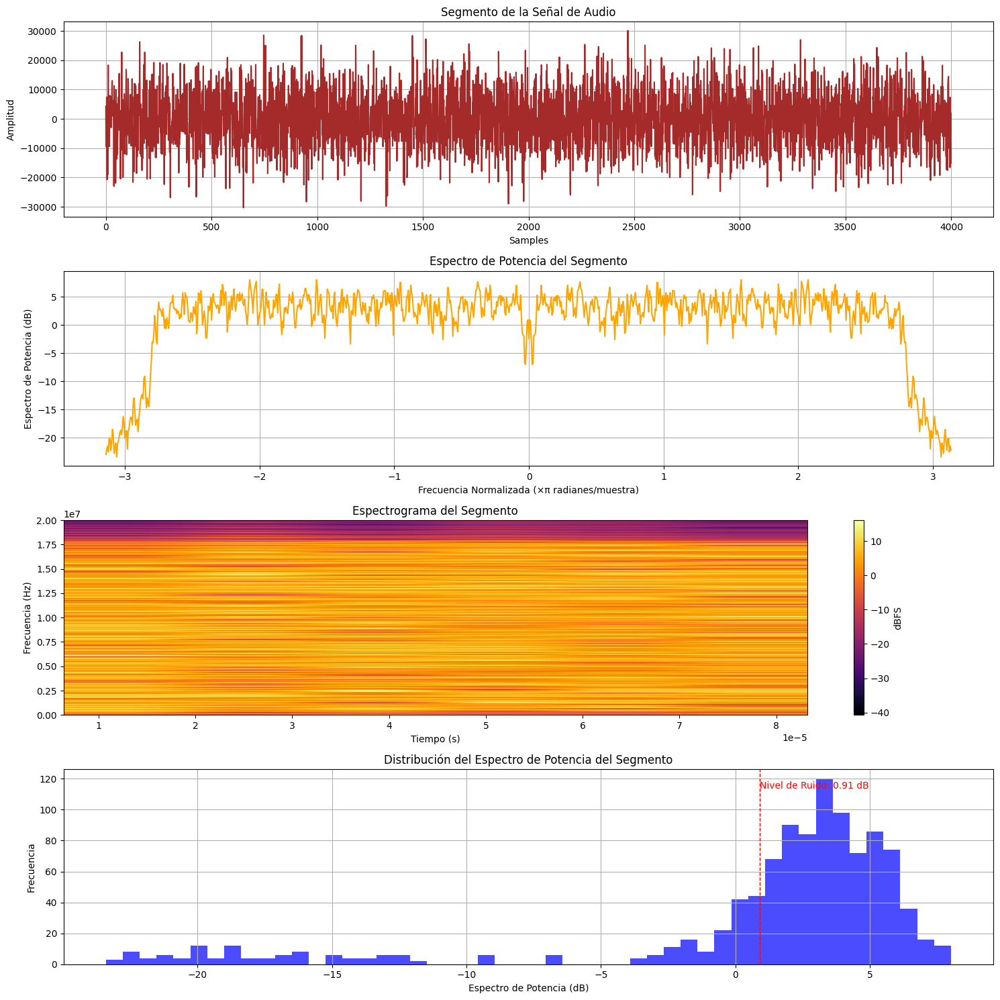

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs5_2024-06-10T22_10_37_840.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-13-31f42da38758>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


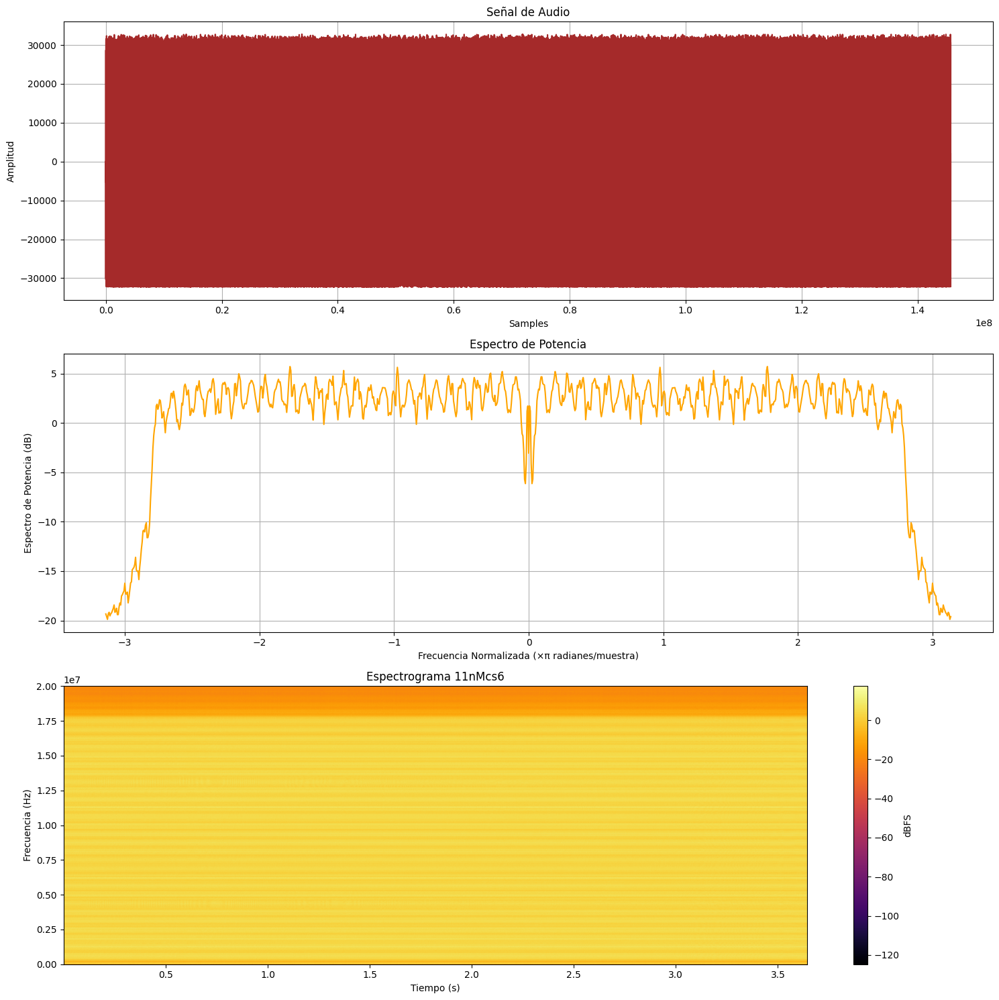

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs6_2024-06-10T22_11_15_732.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs6' )
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-14-46e1ef7796f6>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


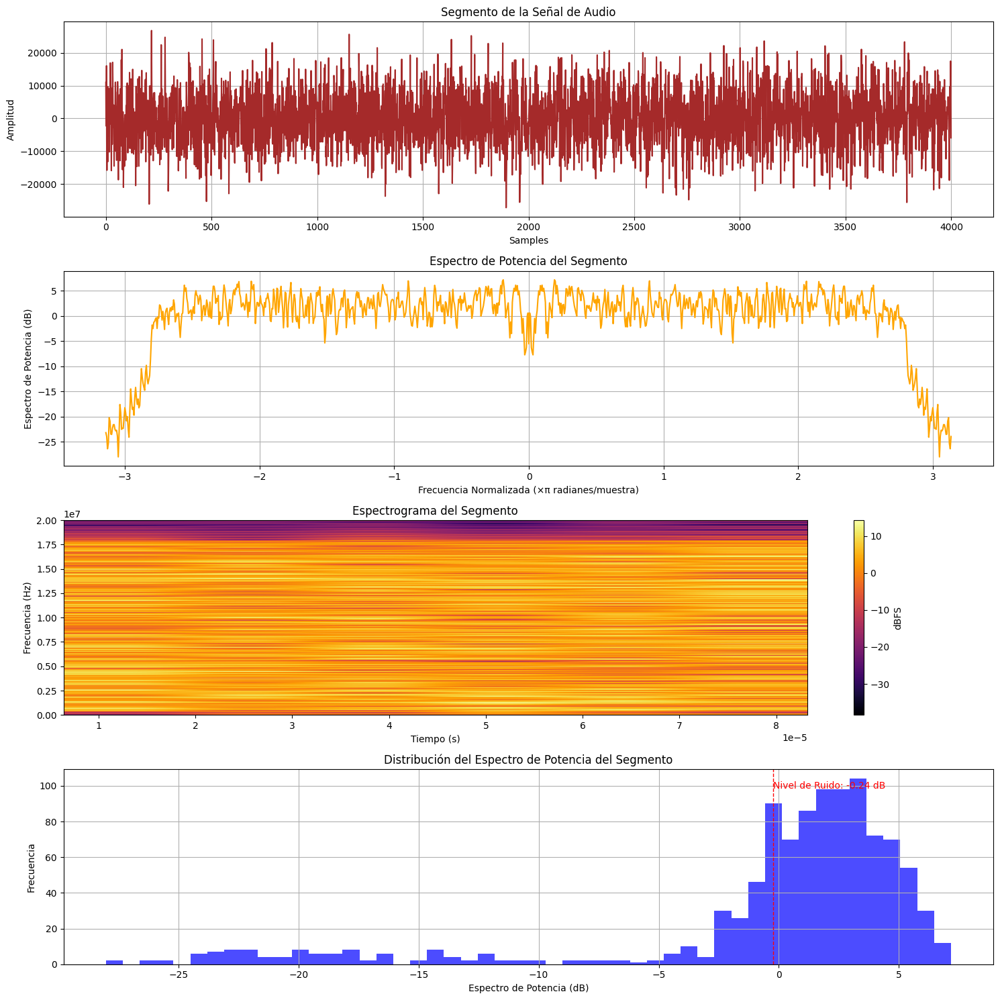

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs6_2024-06-10T22_11_15_732.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-14-6501c890e900>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


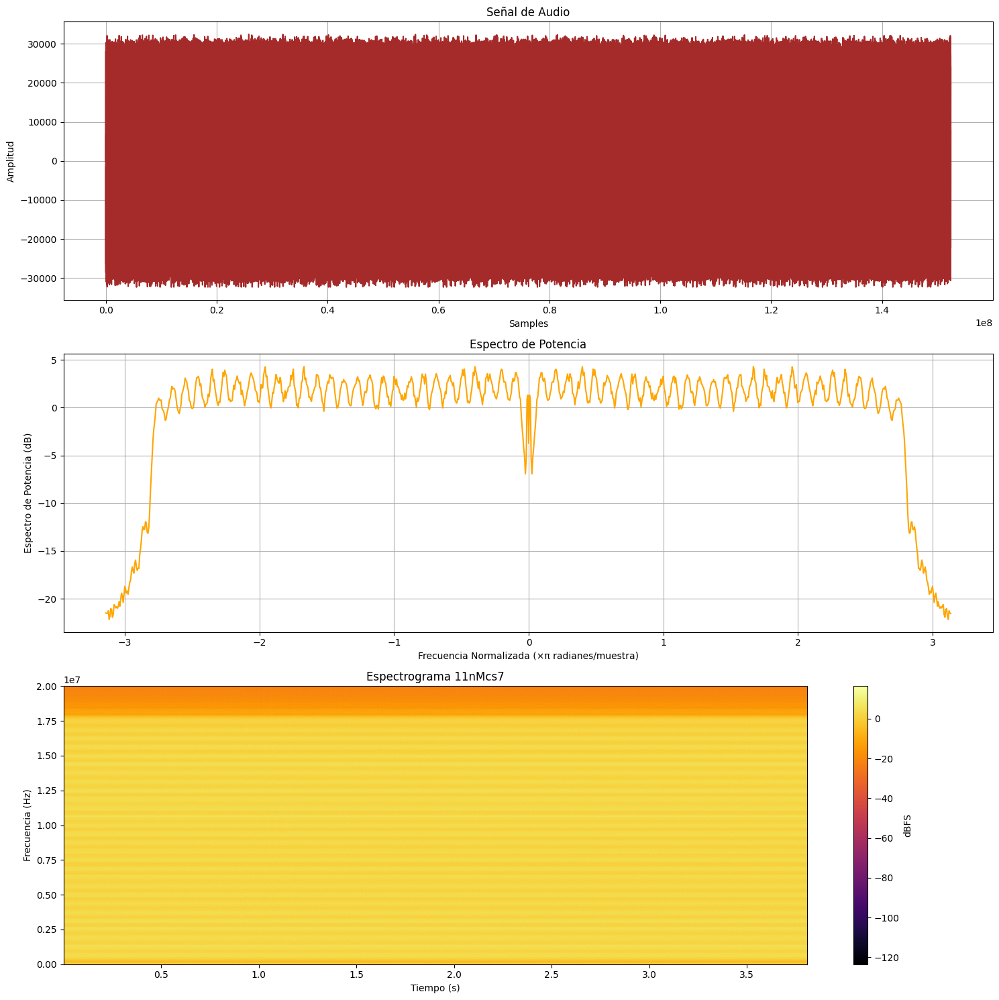

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs7_2024-06-10T22_11_59_227.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11nMcs7')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-15-7f76b10a6ad1>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


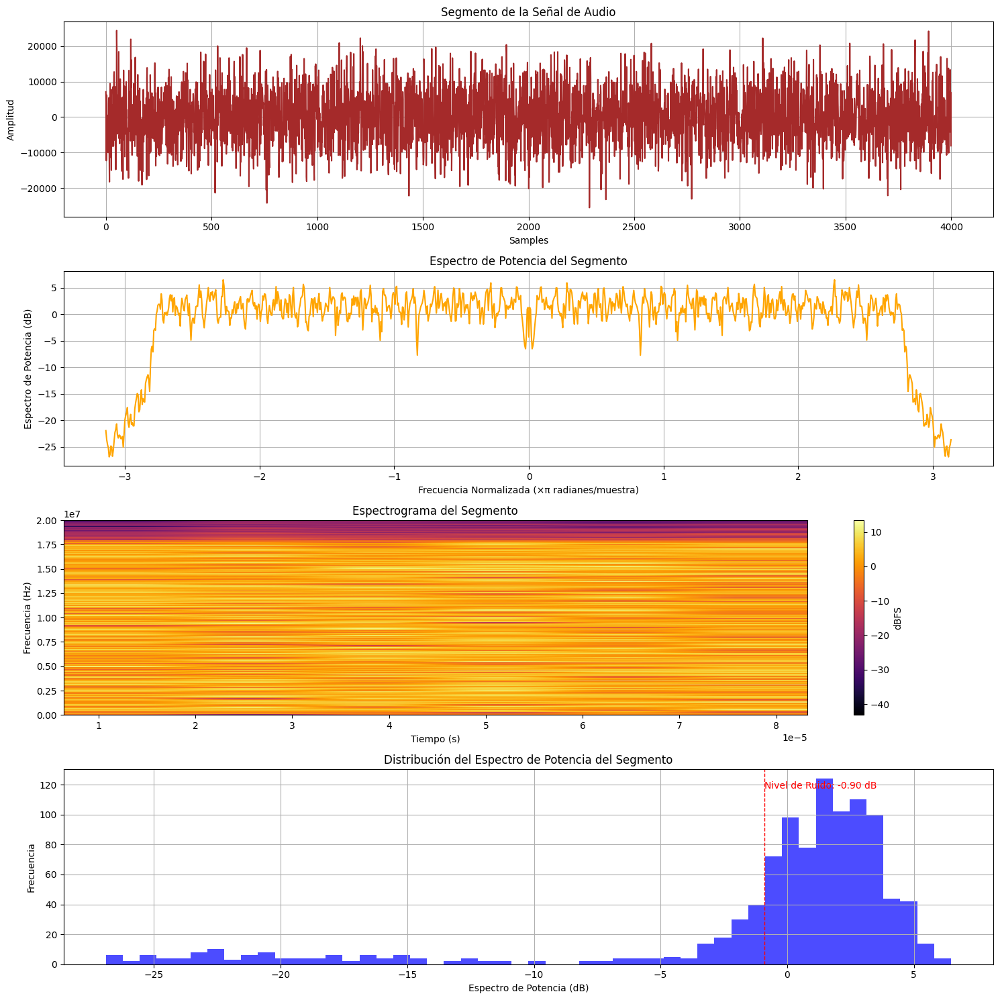

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11nMcs7_2024-06-10T22_11_59_227.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

## Espectrogramas de señales 802.11g

<ipython-input-15-df1a36130043>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


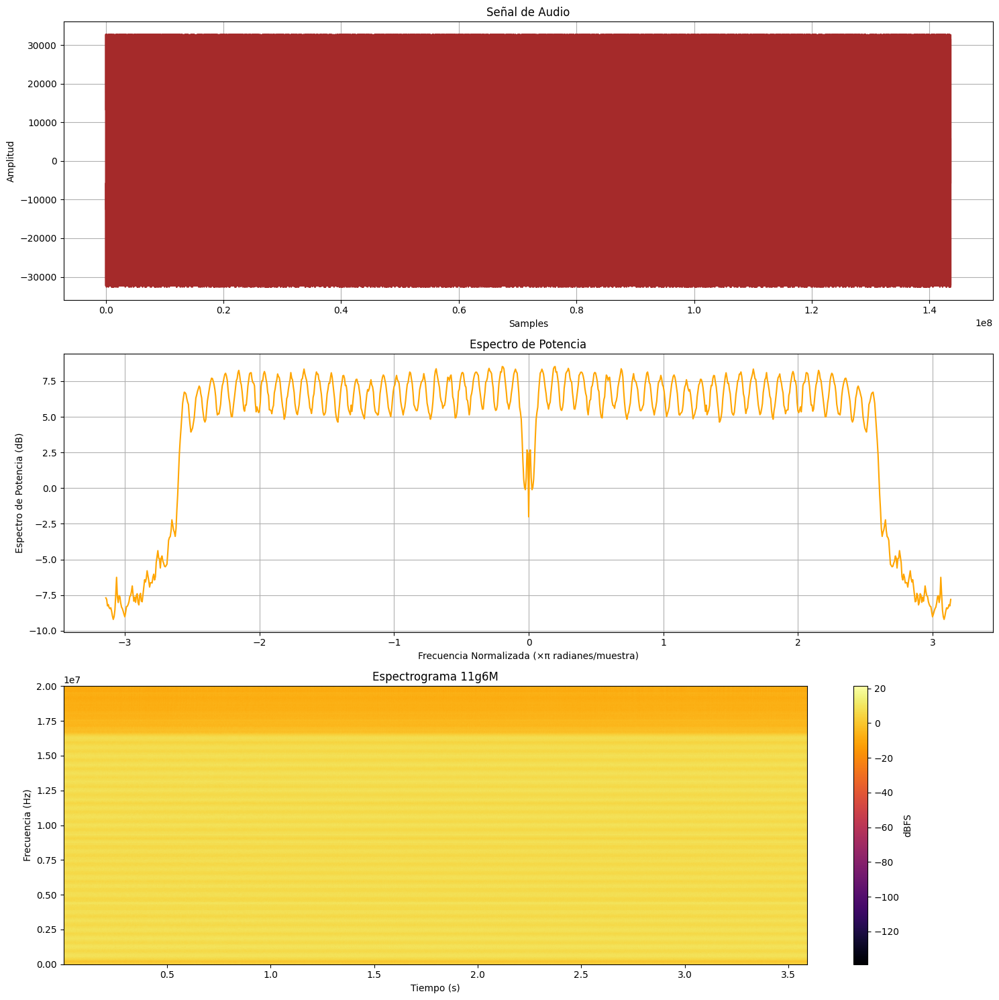

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g6M_2024-06-10T22_14_41_252.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g6M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-16-450f3aa5a9e1>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


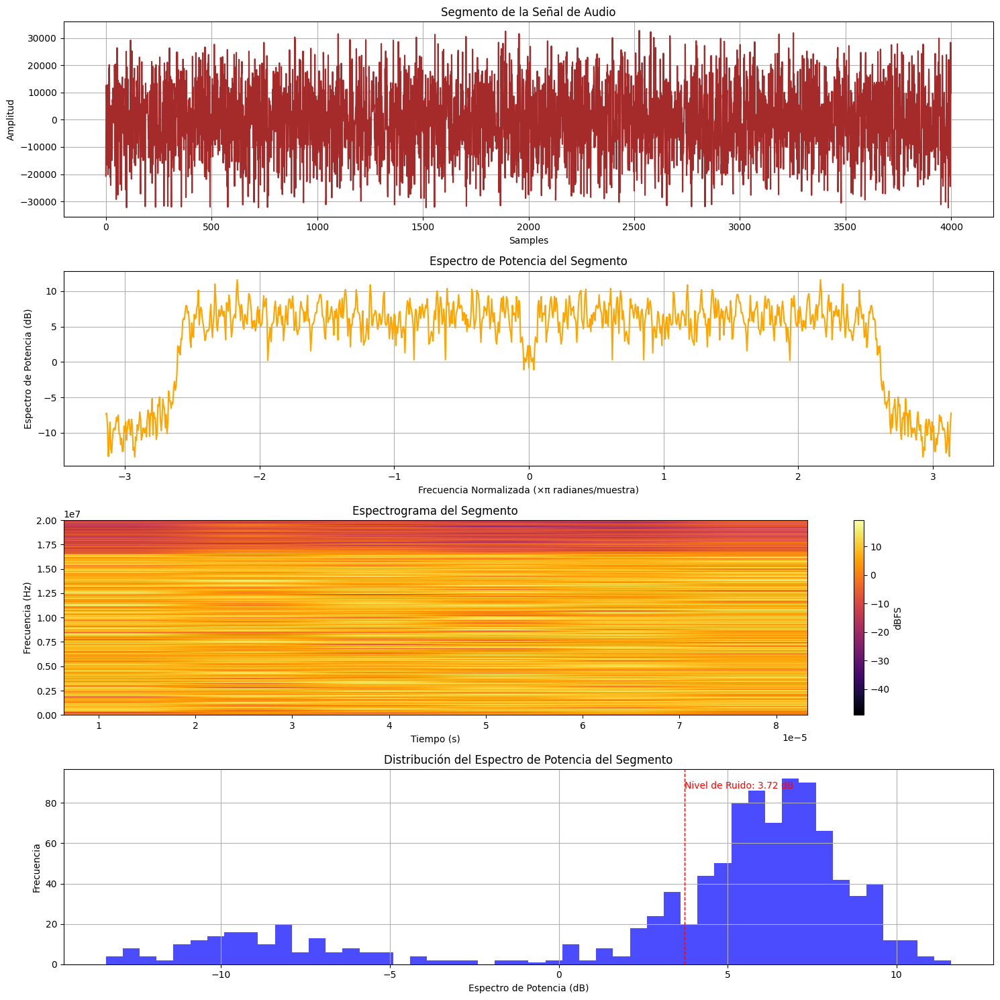

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g6M_2024-06-10T22_14_41_252.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-16-f6f187f57a1d>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


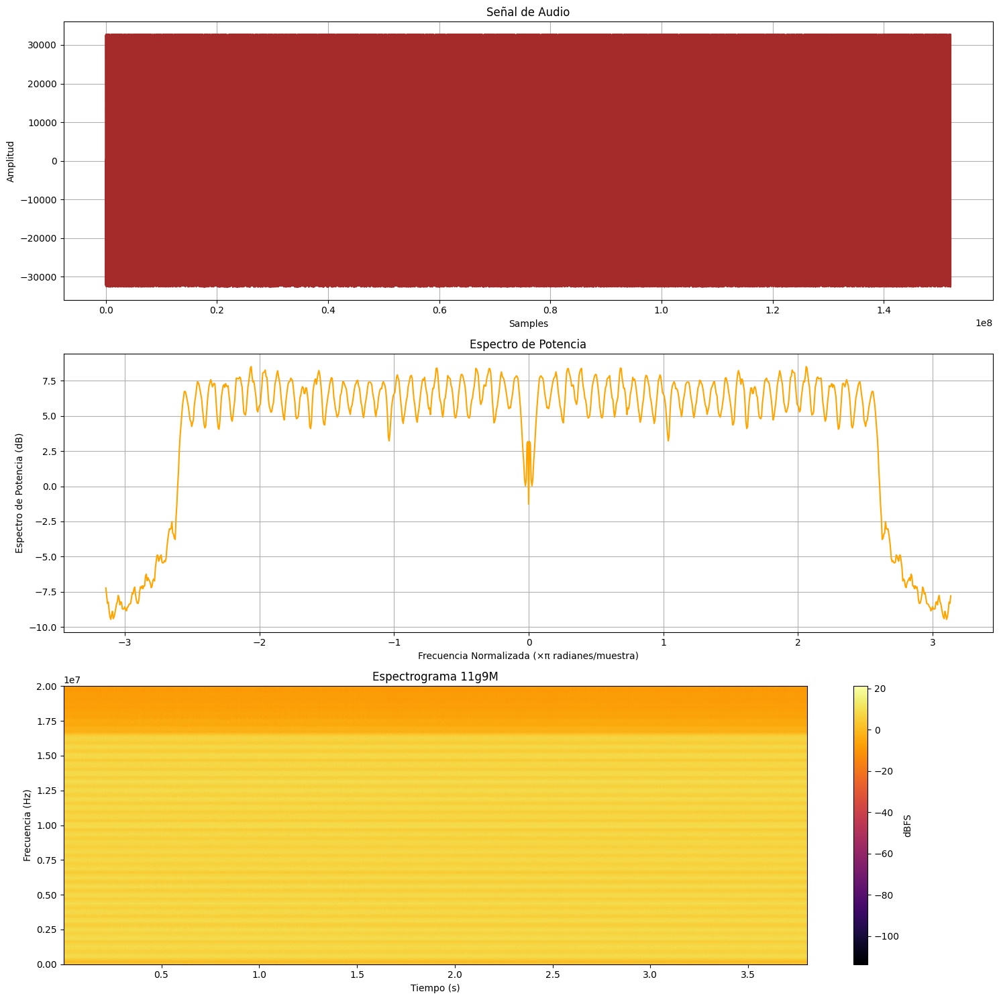

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g9M_2024-06-10T22_15_14_523.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g9M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-17-4a121826b0a0>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


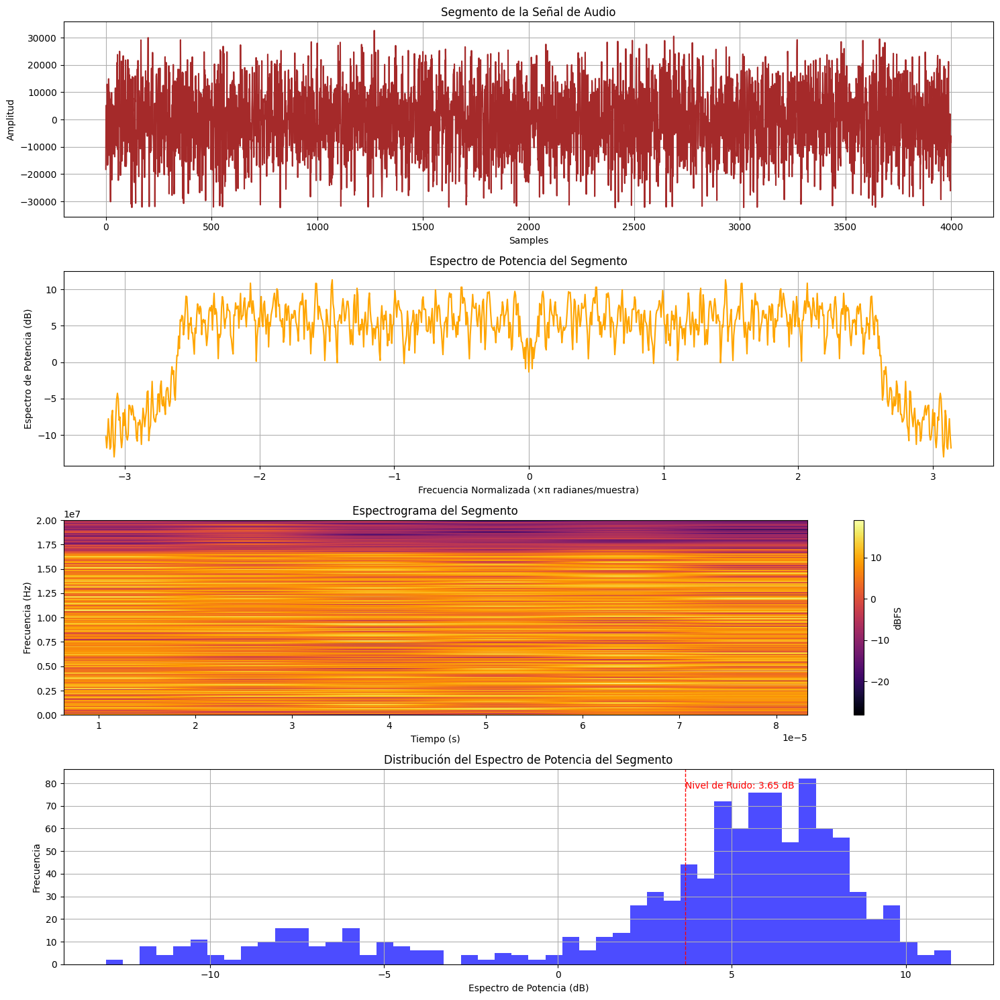

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g9M_2024-06-10T22_15_14_523.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-17-7c8b077e2f60>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


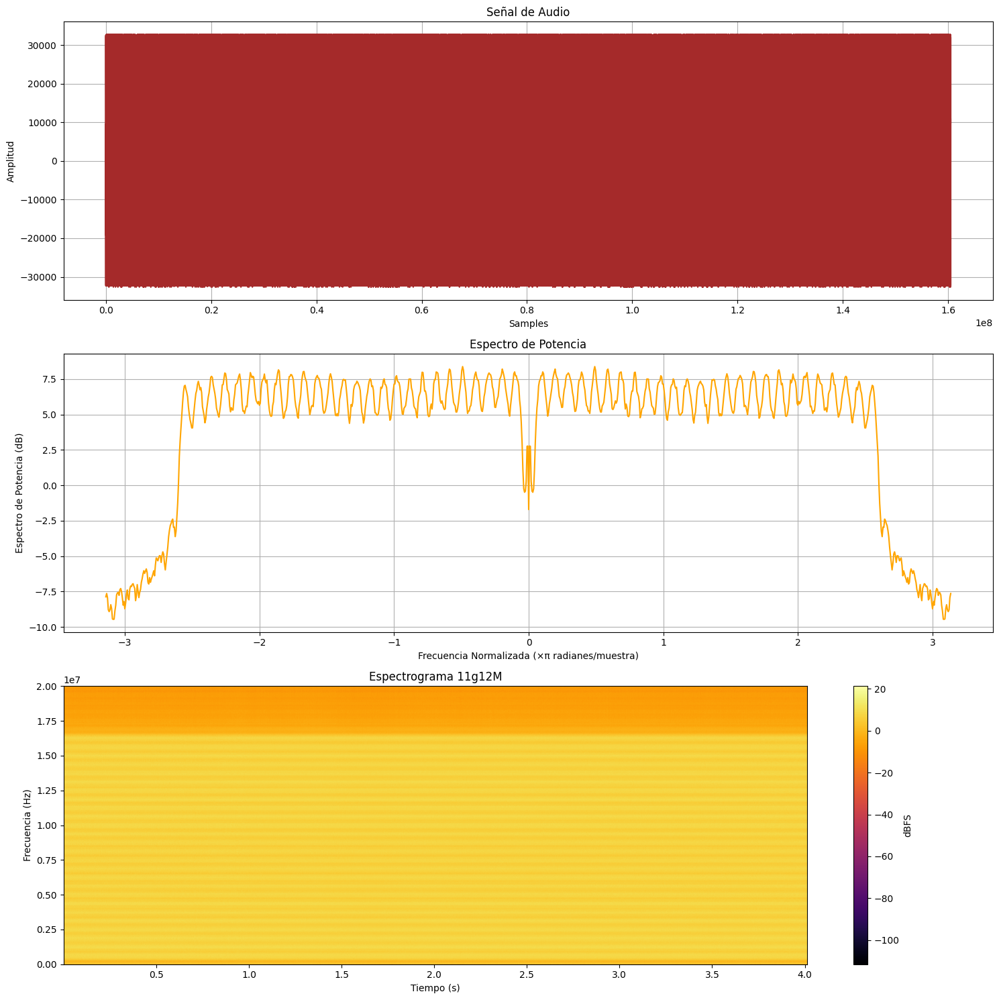

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g12M_2024-06-10T22_15_47_218.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g12M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-6-2d2207b8456c>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


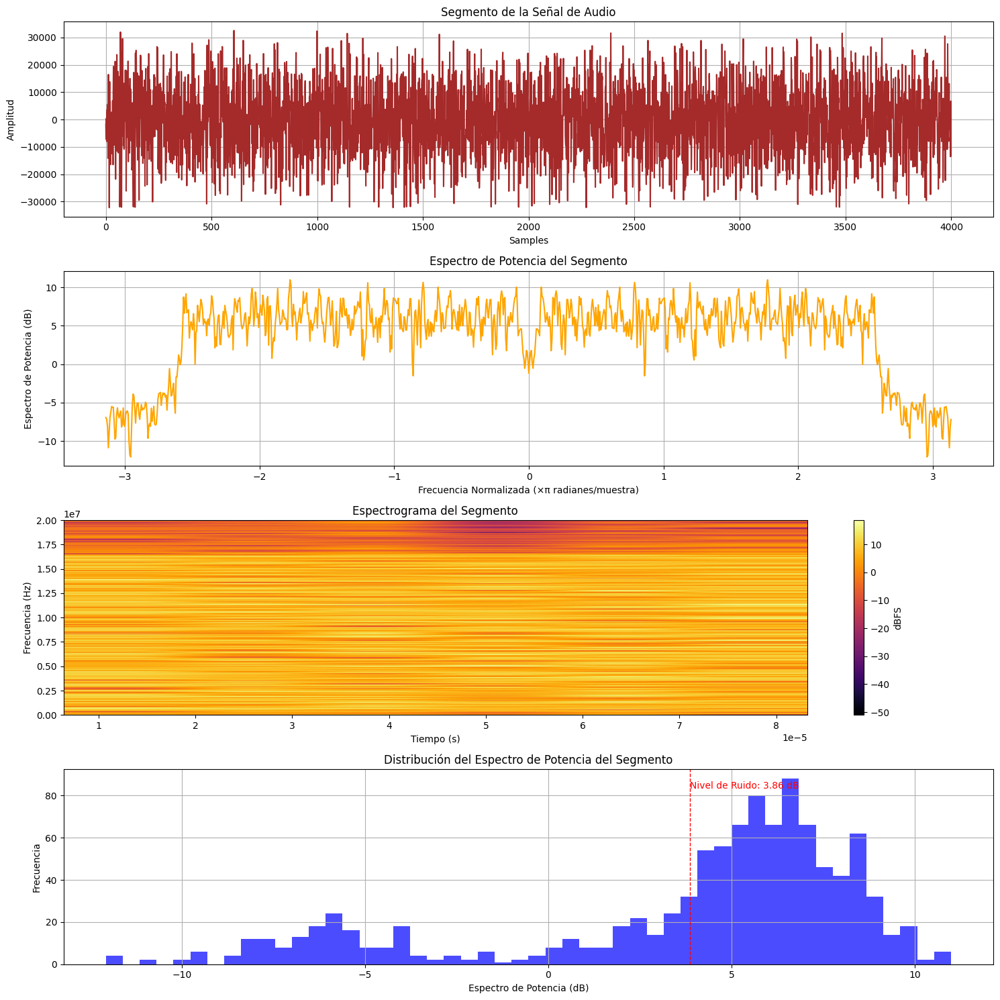

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g12M_2024-06-10T22_15_47_218.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-18-2a47f6aa3e14>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


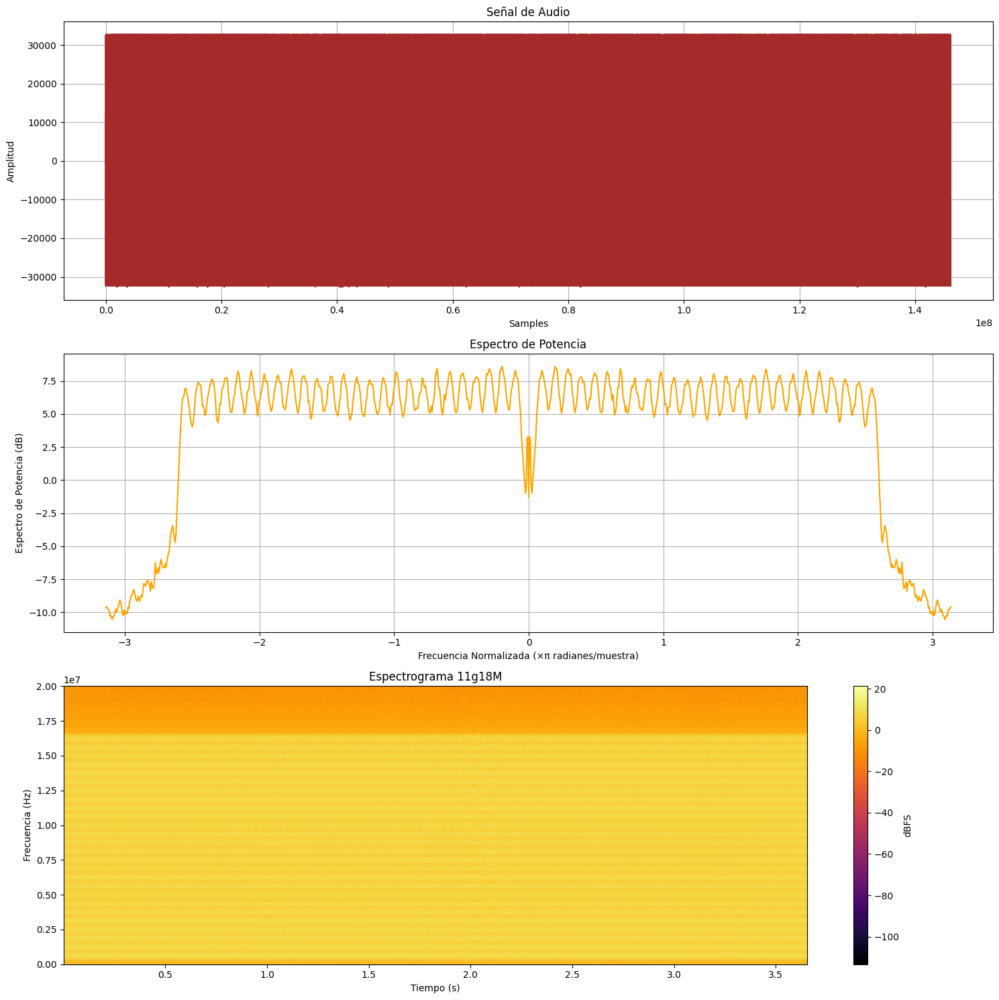

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g18M_2024-06-10T22_16_22_663.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g18M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-18-5d483a8fcc9d>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


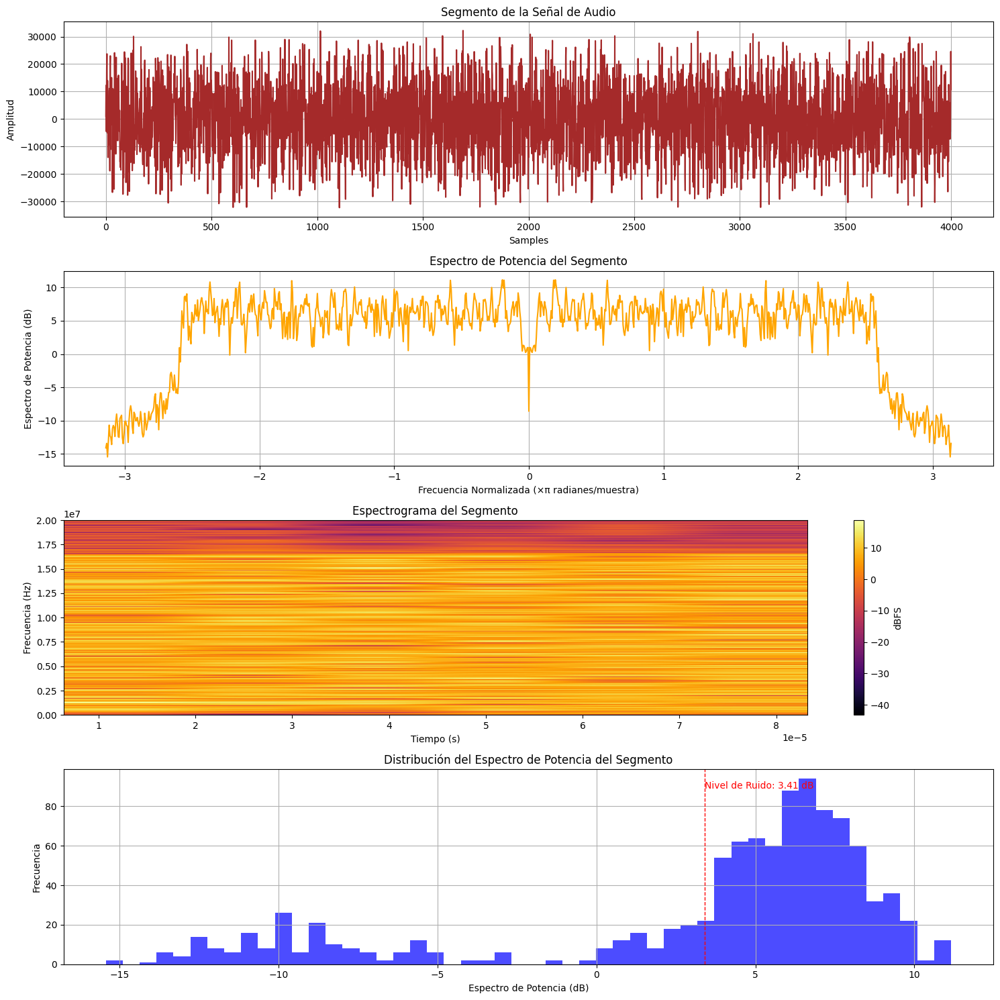

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g18M_2024-06-10T22_16_22_663.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-19-b29dd2345a70>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


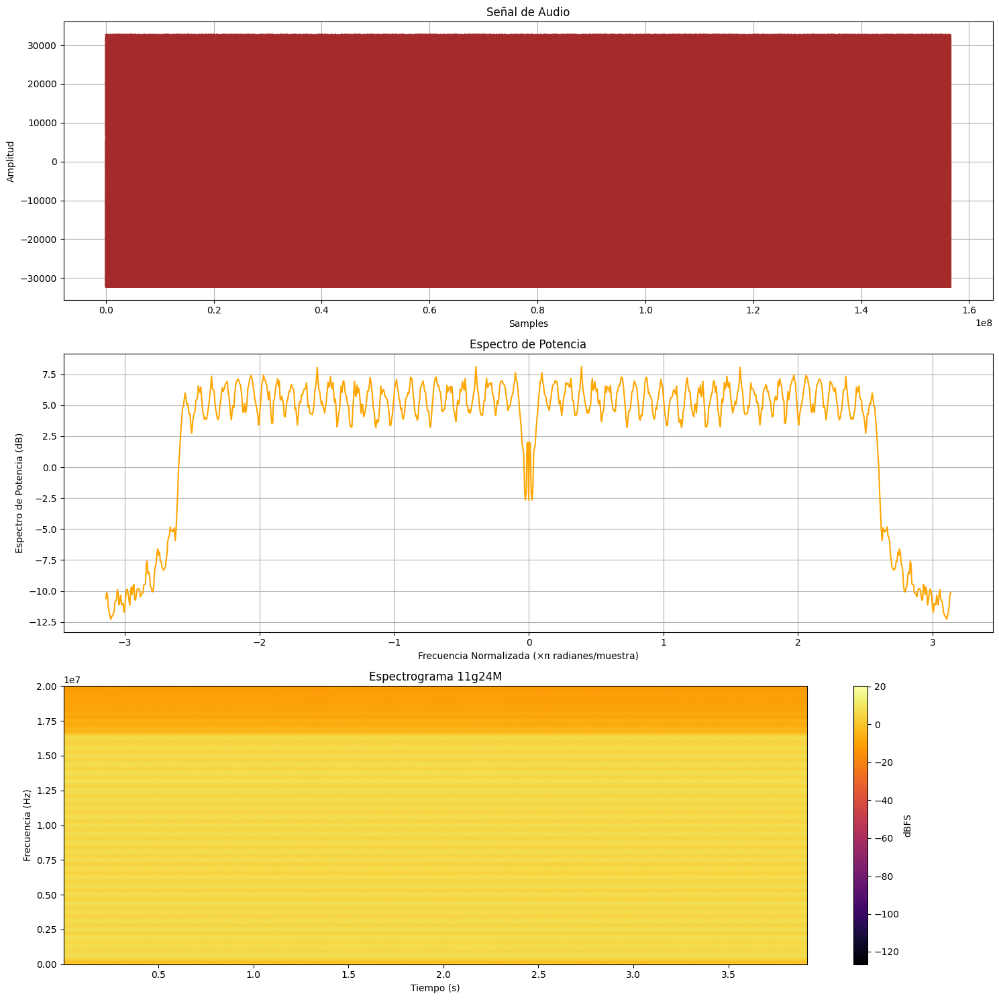

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g24M_2024-06-10T22_17_21_574.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g24M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-19-98c5d6d810c8>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


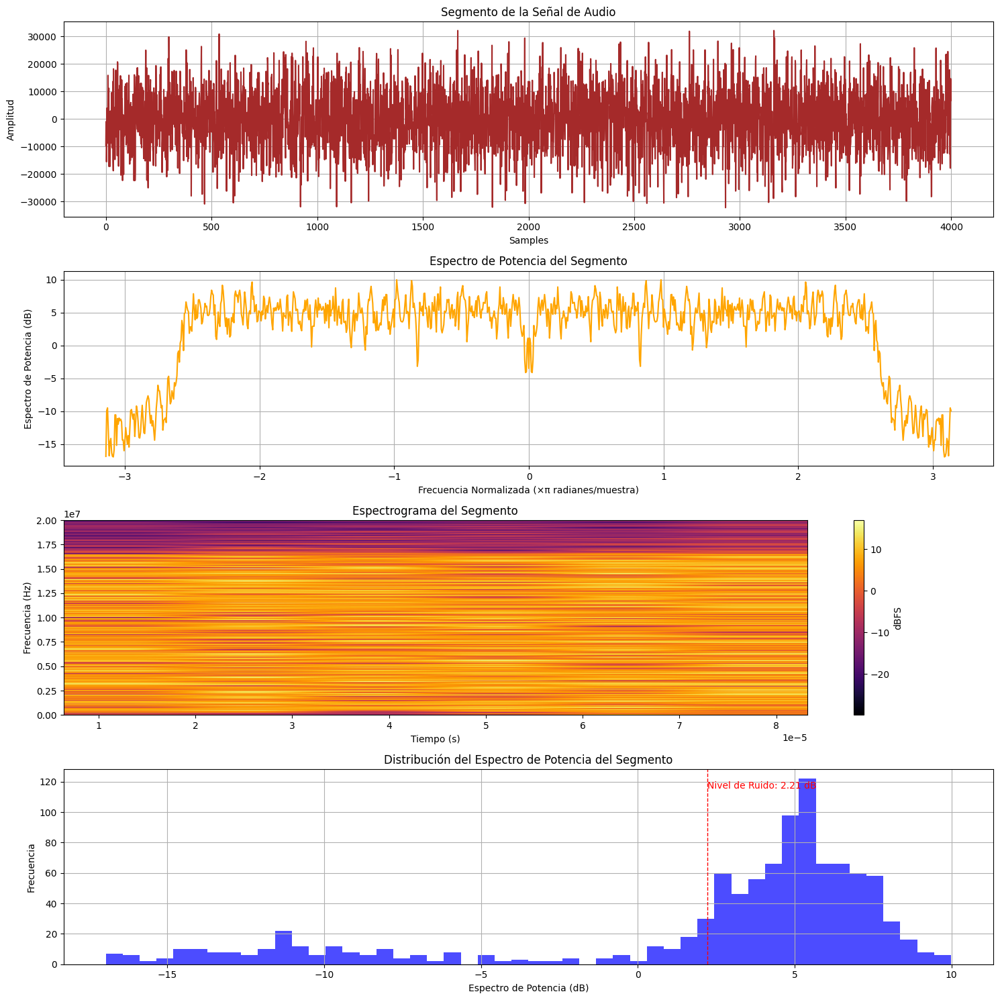

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g24M_2024-06-10T22_17_21_574.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-29-2ac4a76fdc22>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


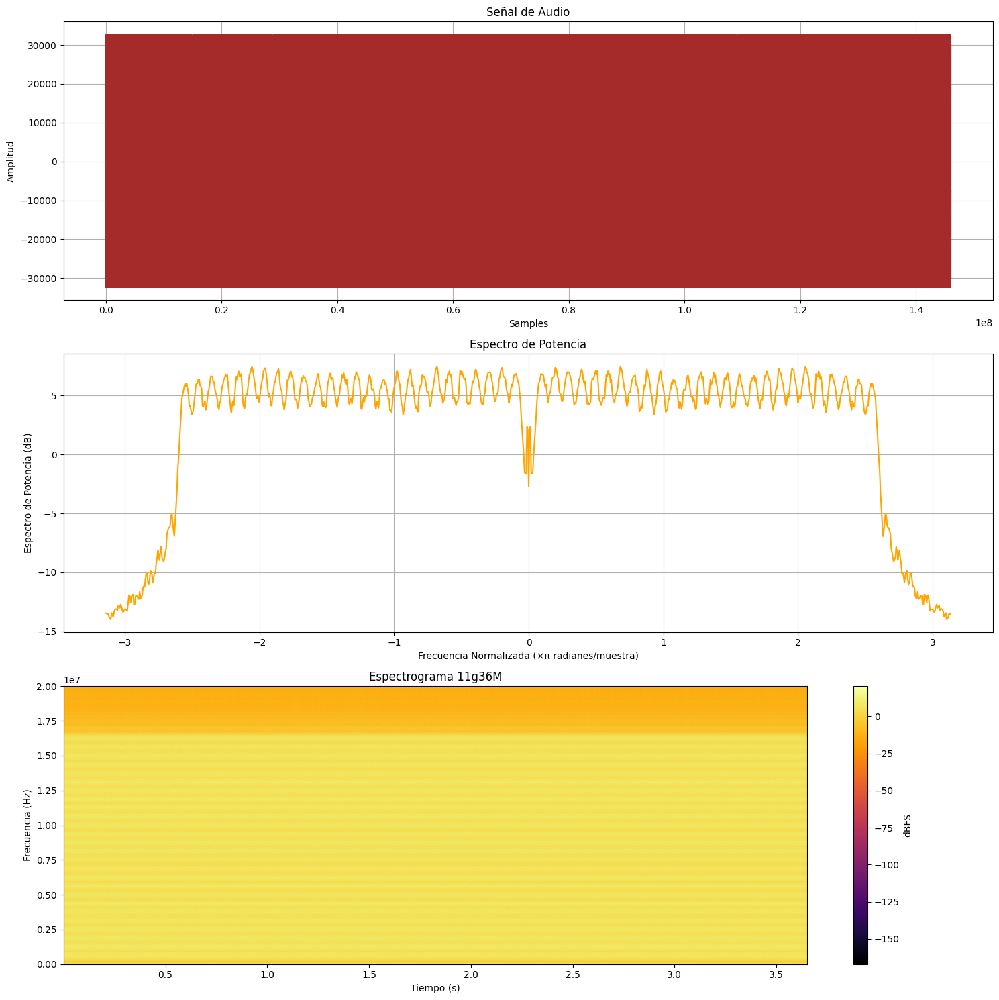

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g36M_2024-06-10T22_17_57_895.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g36M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-20-ec552a415656>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


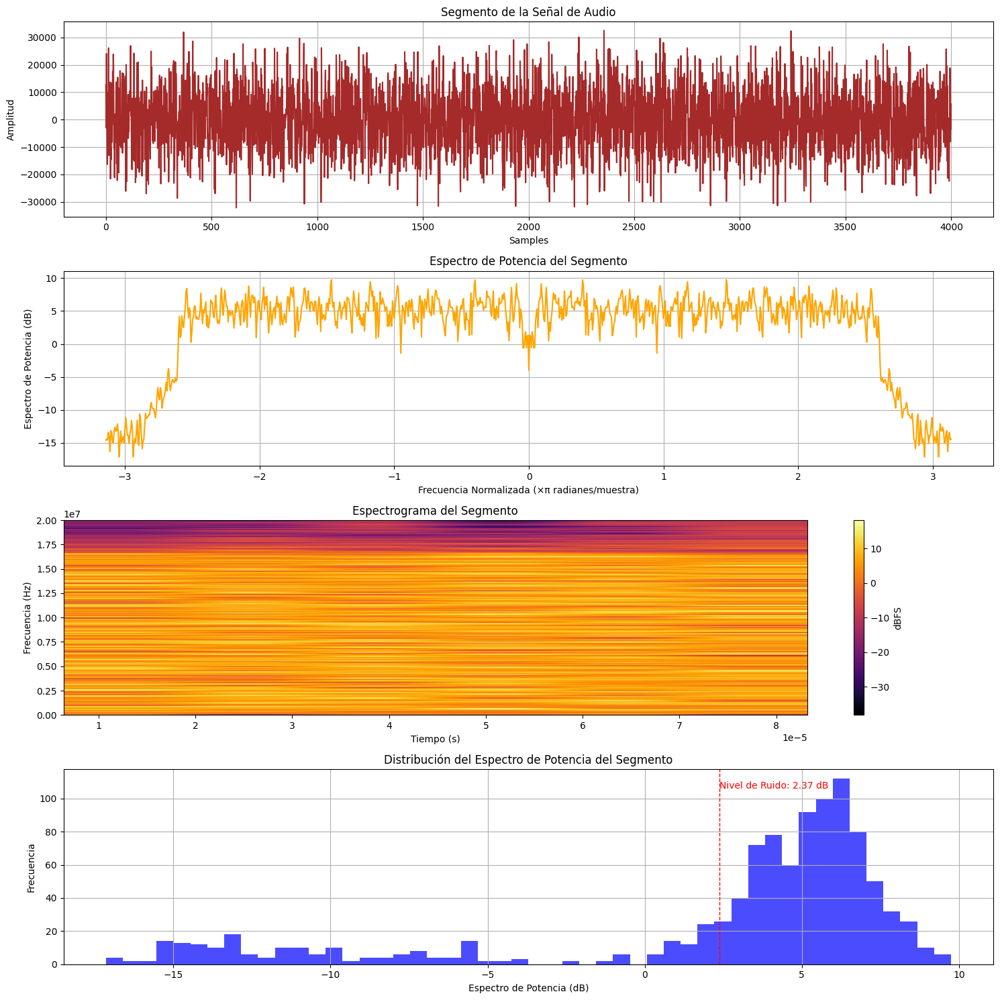

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g36M_2024-06-10T22_17_57_895.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-21-2b158a49d95c>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


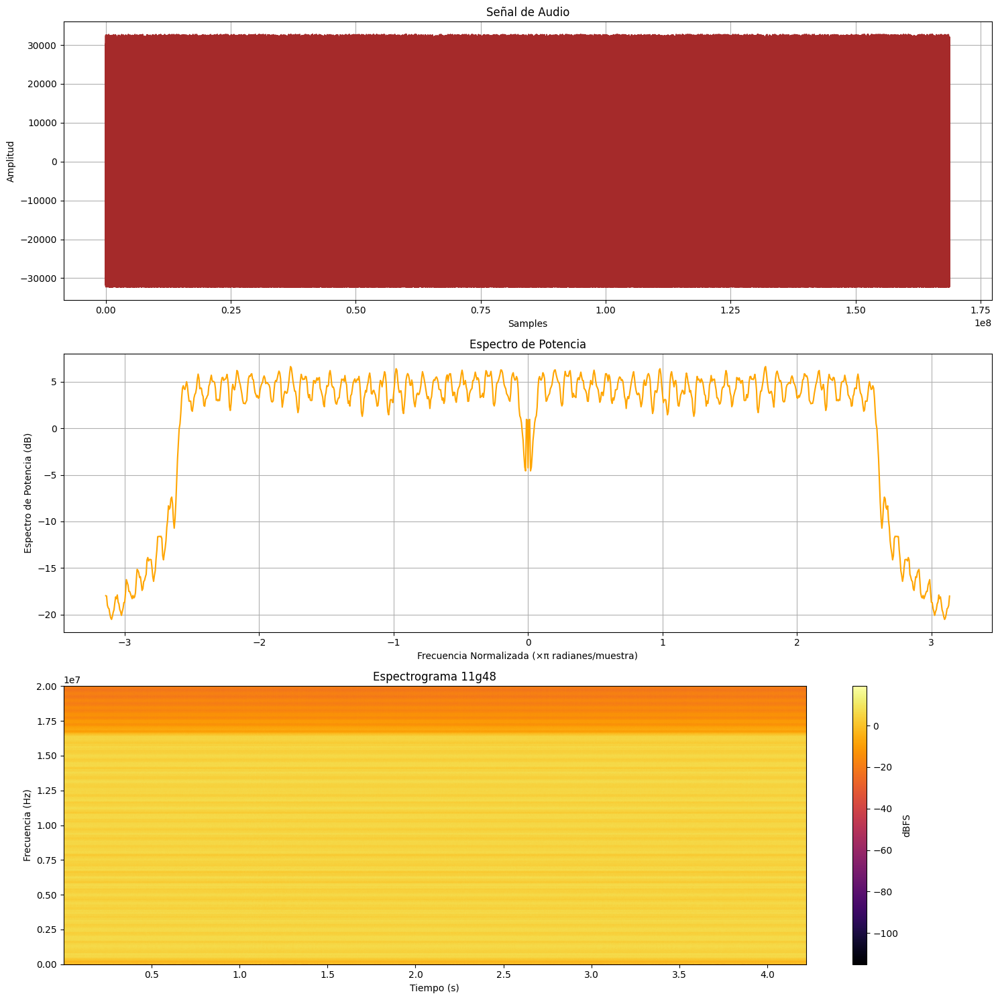

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g48M_2024-06-10T22_18_40_177.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g48')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-5-f70174be1458>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


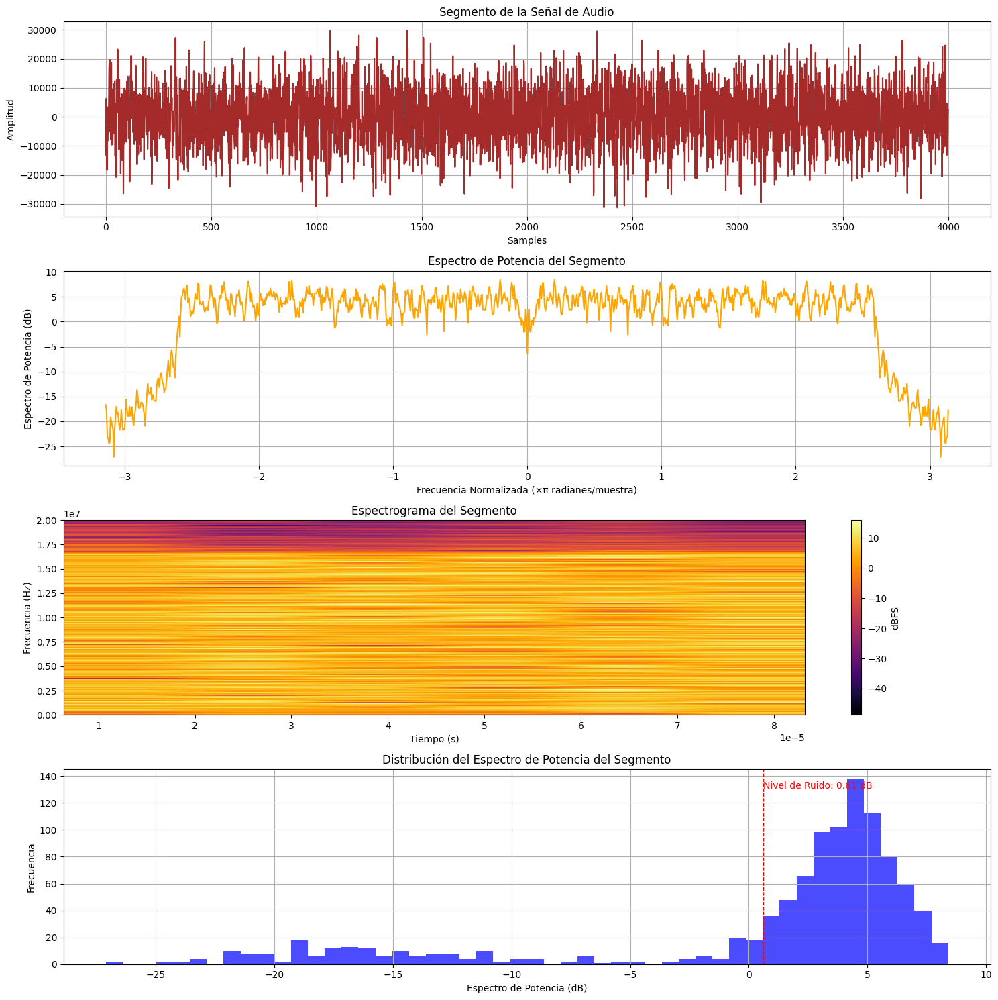

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g48M_2024-06-10T22_18_40_177.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()

<ipython-input-22-b072dcf8a7ab>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


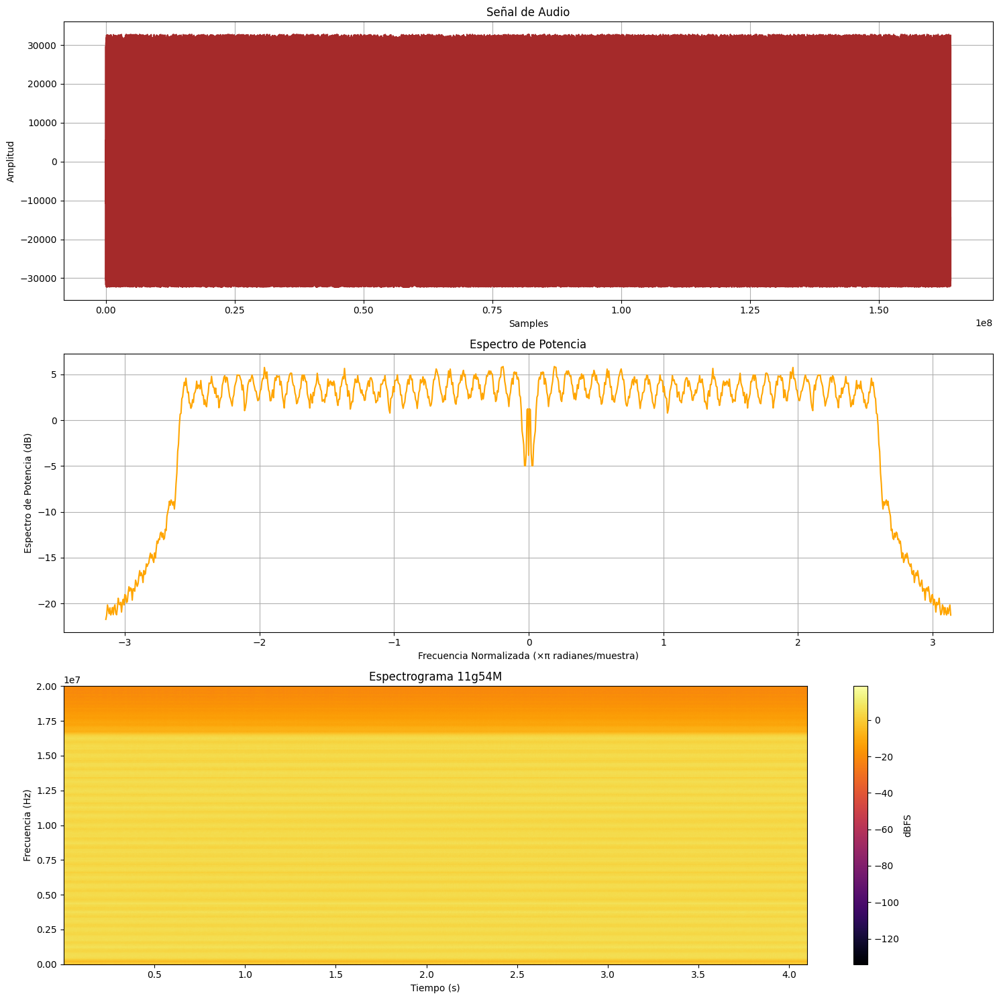

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g54M_2024-06-10T22_19_27_061.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica de la señal de audio
plt.subplot(3, 1, 1)
plt.plot(data, color='brown')
plt.title('Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(data, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(3, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma
plt.subplot(3, 1, 3)
plt.specgram(data, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma 11g54M')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

plt.tight_layout()
plt.show()

<ipython-input-4-b795e5bb381f>:9: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read(file_path)


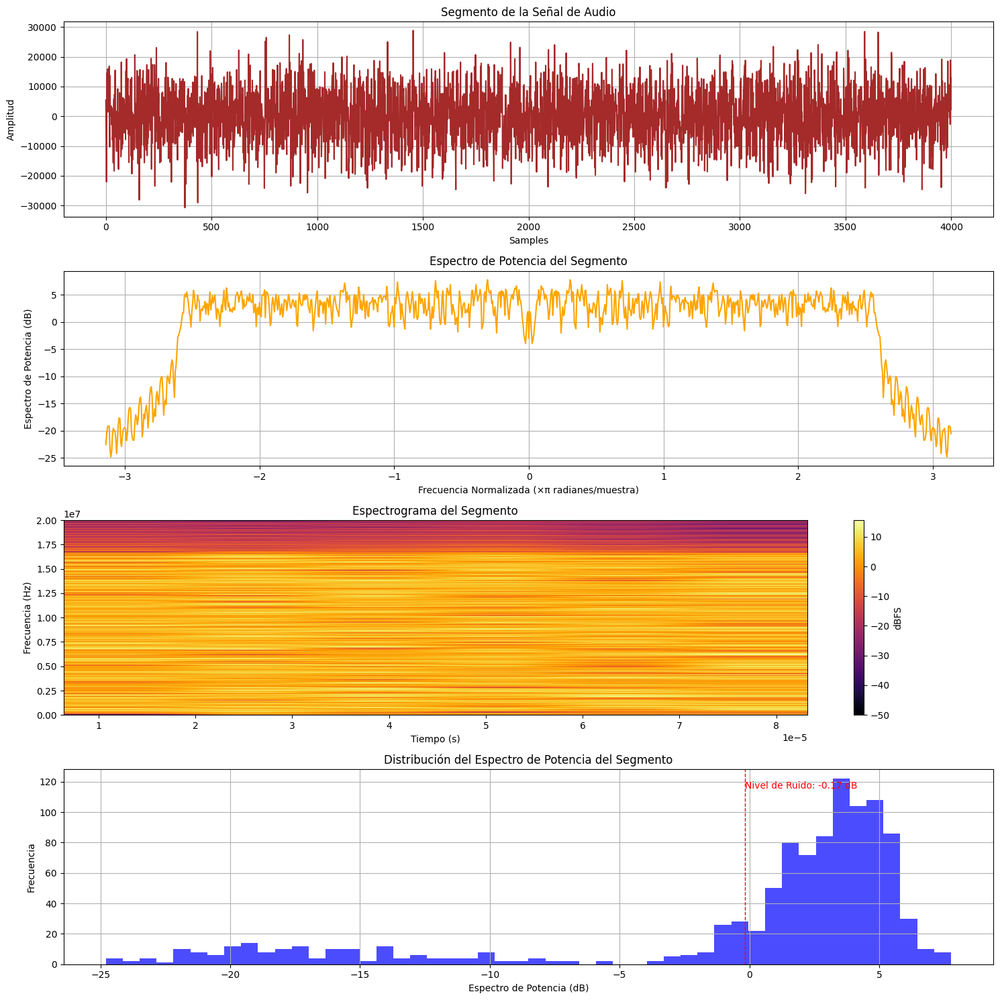

In [ ]:
# Importar las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
from scipy.signal import welch

# Leer el archivo de audio desde los archivos del proyecto
file_path = '/content/drive/My Drive/ExamenB2/11g54M_2024-06-10T22_19_27_061.wav'
sample_rate, data = wavfile.read(file_path)

# Verificar si el archivo de audio es estéreo o mono
if len(data.shape) > 1:
    data = data[:, 0]  # Si es estéreo, tomar solo un canal

# Seleccionar un segmento específico de la señal (por ejemplo, de la muestra 1000 a la 5000)
start_sample = 1000
end_sample = 5000
segment = data[start_sample:end_sample]

# Crear la figura para las gráficas
plt.figure(figsize=(15, 15))

# Gráfica del segmento de la señal de audio
plt.subplot(4, 1, 1)
plt.plot(segment, color='brown')
plt.title('Segmento de la Señal de Audio')
plt.xlabel('Samples')
plt.ylabel('Amplitud')
plt.grid()

# Calcular y graficar el espectro de potencia del segmento, incluyendo frecuencias negativas
frequencies, power_spectrum = welch(segment, sample_rate, nperseg=1024, return_onesided=False)

# Convertir el espectro de potencia a dB
power_spectrum_db = 10 * np.log10(power_spectrum)

# Normalizar las frecuencias para que incluyan tanto las positivas como las negativas
normalized_frequencies = np.fft.fftshift(frequencies / sample_rate) * 2 * np.pi

# Graficar el espectro de potencia incluyendo las frecuencias negativas
plt.subplot(4, 1, 2)
plt.plot(normalized_frequencies, np.fft.fftshift(power_spectrum_db), color='orange')
plt.title('Espectro de Potencia del Segmento')
plt.xlabel('Frecuencia Normalizada (×π radianes/muestra)')
plt.ylabel('Espectro de Potencia (dB)')
plt.grid()

# Gráfica del espectrograma del segmento
plt.subplot(4, 1, 3)
plt.specgram(segment, Fs=sample_rate, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma del Segmento')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='dBFS')

# Analizar el nivel de ruido en el segmento
noise_level = np.mean(power_spectrum_db)
plt.subplot(4, 1, 4)
plt.hist(power_spectrum_db, bins=50, color='blue', alpha=0.7)
plt.title('Distribución del Espectro de Potencia del Segmento')
plt.xlabel('Espectro de Potencia (dB)')
plt.ylabel('Frecuencia')
plt.axvline(noise_level, color='red', linestyle='dashed', linewidth=1)
plt.text(noise_level, plt.ylim()[1]*0.9, f'Nivel de Ruido: {noise_level:.2f} dB', color='red')
plt.grid()

plt.tight_layout()
plt.show()